<a href="https://colab.research.google.com/github/ReillyOareVT/HydroLearners_Proj/blob/main/clustering/Static_EDA_and_Transform.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Static Data EDA & Transformations**
**Author:** Emma Reilly Oare
<br>**Date:** April 29, 2025
<br>**Purpose:** Exploratory data analysis (EDA) and Transformations of all static attributes for later feature engineering. These datasets will be used for clustering and mean regression.

In [1]:
# Read in libs
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import seaborn as sns
import numpy as np
import os
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler, PowerTransformer, QuantileTransformer, StandardScaler
import scipy.stats as stats
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel
import warnings

# Show all columns
pd.set_option('display.max_columns', None)

# Suppress warnings
warnings.filterwarnings("ignore")

In [2]:
# Only clone if the repo doesn't already exist
if not os.path.exists('/content/HydroLearners_Proj'):
    !git clone https://github.com/ReillyOareVT/HydroLearners_Proj

# Change directory
BASE_DIR = '/content/HydroLearners_Proj'
os.chdir(BASE_DIR)

# Confirm location
!pwd

Cloning into 'HydroLearners_Proj'...
remote: Enumerating objects: 113, done.
remote: Counting objects: 100% (113/113), done.
remote: Compressing objects: 100% (109/109), done.
remote: Total 113 (delta 35), reused 22 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (113/113), 31.24 MiB | 8.07 MiB/s, done.
Resolving deltas: 100% (35/35), done.
Updating files: 100% (39/39), done.
/content/HydroLearners_Proj


## Step 1: Read in Data

In [3]:
# Define path
static_path = os.path.join(BASE_DIR, 'eda', 'processed_data', 'joined_static_df.xlsx')

# Read in df
static_df = pd.read_excel(static_path).drop(columns = 'Unnamed: 0')

In [4]:
# Display df
static_df

,Basin ID,% Evaporites,% Ice and Glaciers,% Metamorphics,% No Data,% Acid Plutonic Rocks,% Basic Putonic Rocks,% ntermedite Plutonic Rocks,% Pyroclastics,% Carbonate Sedimentary Rocks,% Mixed Sedimentary Rocks,% Siliciclastic Sedimentary Rocks,% Unconsolidated Sediments,% Acid Volcanic Rocks,% Basic Volcanic Rocks,% Intermediate Volcanic Rocks,% Water Bodies,Lithological Dominant Class,% of Watershed in GLiM,Depth to Bedrock,# of Upstream Dams,# of Upstream Reservoirs,# of Upstream Lakes,Total Area of Upstream Lakes,Total Upstream Lake Volume,Mean Daily Streamflow (mm/day),Ratio of Mean Daily Streamflow/Precipitation,Streamflow Precipitation Elasticity,5% Flow Quantile (mm/day),95% Flow Quantile (mm/day),Days/Year with No Flow,Mean Daily Precipitation (mm/day),Mean Daily PET (mm/day),Ratio of PET/Precipitation,Seasonality/Timing of Precipitation,Fraction of Snow on Days <0 C,Days/Year of High Precipitation,Avg Duration of High Precipitation,Season of High Precipitation Events,Days/Year of Low Precipitation,Avg Duration of Low Precipitation,Season of Low Precipitation Events,# of Years with Hydrological Observations,First Date with Hydrological Observations,End Date of Hydrological Observations,# of Years with Meteorological Observations,First Date with Meteorological Observations,End Date of Meteorological Observations,Mean Root Depth (cm),Max Root Depth (cm),Min Root Depth (cm),5% Quantile Root Depth (cm),25% Quantile Root Depth (cm),50% Quantile Root Depth (cm),75% Quantile Root Depth (cm),90% Quantile Root Depth (cm),Mean Available Water Content (mm),Max Available Water Content (mm),Min Available Water Content (mm),5% Quantile Water Content (mm),25% Quantile Water Content (mm),50% Quantile Water Content (mm),75% Quantile Water Content (mm),90% Quantile Water Content (mm),Mean % Sand in Soil,Max % Sand in Soil,Min % Sand in Soil,5% Quantile % Sand in Soil,25% Quantile % Sand in Soil,50% Quantile % Sand in Soil,75% Quantile % Sand in Soil,90% Quantile % Sand in Soil,Mean % Silt in Soil,Max % Silt in Soil,Min % Silt in Soil,5% Quantile % Silt in Soil,25% Quantile % Silt in Soil,50% Quantile % Silt in Soil,75% Quantile % Silt in Soil,90% Quantile % Silt in Soil,Mean % Clay in Soil,Max % Clay in Soil,Min % Clay in Soil,5% Quantile % Clay in Soil,25% Quantile % Clay in Soil,50% Quantile % Clay in Soil,75% Quantile % Clay in Soil,90% Quantile % Clay in Soil,Mean % Gravel in Soil,Max % Gravel in Soil,Min % Gravel in Soil,5% Quantile % Gravel in Soil,25% Quantile % Gravel in Soil,50% Quantile % Gravel in Soil,75% Quantile % Gravel in Soil,90% Quantile % Gravel in Soil,Mean Soil Bulk Density (g/cm3),Max Soil Bulk Density (g/cm3),Min Soil Bulk Density (g/cm3),5% Quantile Soil Bulk Density (g/cm3),25% Quantile Soil Bulk Density (g/cm3),50% Quantile Soil Bulk Density (g/cm3),75% Quantile Soil Bulk Density (g/cm3),90% Quantile Soil Bulk Density (g/cm3),Mean % Soil Organic Material,Max % Soil Organic Material,Min % Soil Organic Material,5% Quantile % Soil Organic Material,25% Quantile % Soil Organic Material,50% Quantile % Soil Organic Material,75% Quantile % Soil Organic Material,90% Quantile % Soil Organic Material,Max Elevation (m),Mean Elevation (m),Min Elevation (m),Mean Terrain Slope (Degrees),% of Watershed Slope <3 Degrees,% of Watershed Slope >15 Degrees,Elongation Ratio,Stream Density (1000km/km2),Mean Jan Leaf-Area Index,Mean Feb Leaf-Area Index,Mean Mar Leaf-Area Index,Mean Apr Leaf-Area Index,Mean May Leaf-Area Index,Mean Jun Leaf-Area Index,Mean Jul Leaf-Area Index,Mean Aug Leaf-Area Index,Mean Sep Leaf-Area Index,Mean Oct Leaf-Area Index,Mean Nov Leaf-Area Index,Mean Dec Leaf-Area Index,Mean Leaf-Area Index,Mean Jan NDVI,Mean Feb NDVI,Mean Mar NDVI,Mean Apr NDVI,Mean May NDVI,Mean Jun NDVI,Mean Jul NDVI,Mean Aug NDVI,Mean Sep NDVI,Mean Oct NDVI,Mean Nov NDVI,Mean NDVI
0,AT000001,0.0,0.553,23.464,0.0,2.657,0.042,0.19,0.0,38.753,5.521,3.888,22.064,0.776,1.858,0.0,0.0,sc,100.0,1.124,23,10,10,6.62,542.33,2.824,0.727,1.266,1.029

## Step 2. Exploratory Data Analysis

### Step 2a. Preliminary, Group-Based EDA
Based on the DataCleaning notebook, we have a good idea of which columns come from which datasets. We'll look at these groups individually first.

#### Geology

In [5]:
# Identify % geology columns
geology_cols = [
    '% Evaporites', '% Ice and Glaciers', '% Metamorphics', '% No Data',
    '% Acid Plutonic Rocks', '% Basic Putonic Rocks', '% ntermedite Plutonic Rocks',
    '% Pyroclastics', '% Carbonate Sedimentary Rocks', '% Mixed Sedimentary Rocks',
    '% Siliciclastic Sedimentary Rocks', '% Unconsolidated Sediments',
    '% Acid Volcanic Rocks', '% Basic Volcanic Rocks', '% Intermediate Volcanic Rocks',
    '% Water Bodies'
]

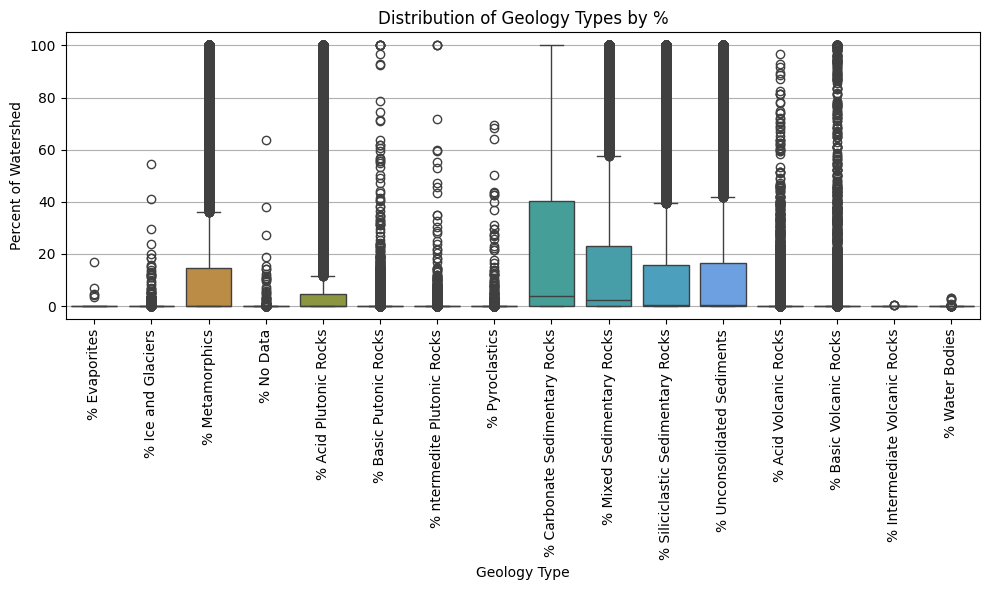

In [6]:
# Create boxplot of % geology types
melted = static_df[geology_cols].melt(var_name='Geology Type', value_name='Percent of Watershed')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Geology Type', y='Percent of Watershed', hue = 'Geology Type')
plt.xticks(rotation=90)
plt.title('Distribution of Geology Types by %')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

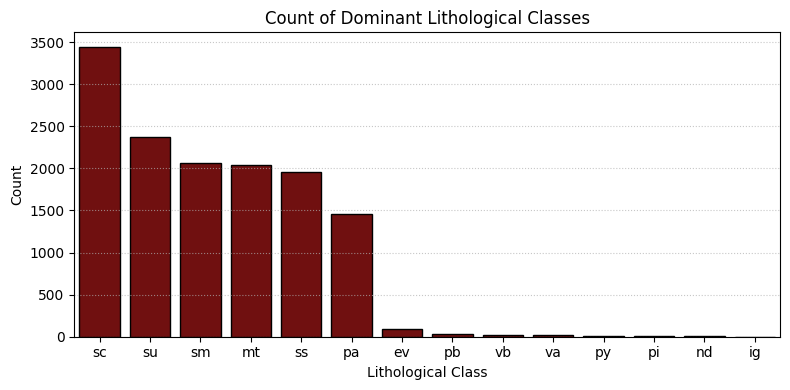

In [7]:
# Plot bar plot of dominant lithological class
plt.figure(figsize=(8, 4))
sns.countplot(data=static_df, x='Lithological Dominant Class',
              order=static_df['Lithological Dominant Class'].value_counts().index,
              color = 'maroon', edgecolor = 'k')
plt.title('Count of Dominant Lithological Classes')
plt.xlabel('Lithological Class')
plt.ylabel('Count')
plt.grid(axis = 'y', alpha = 0.7, linestyle = ':')
plt.tight_layout()
plt.show()

#### Hydrology Attributes

In [8]:
# Identify hydrology attribute columns
num_things_cols = [
    '# of Upstream Dams',	'# of Upstream Reservoirs',	'# of Upstream Lakes'
]
storage_cols =[
    'Total Area of Upstream Lakes',	'Total Upstream Lake Volume'
]

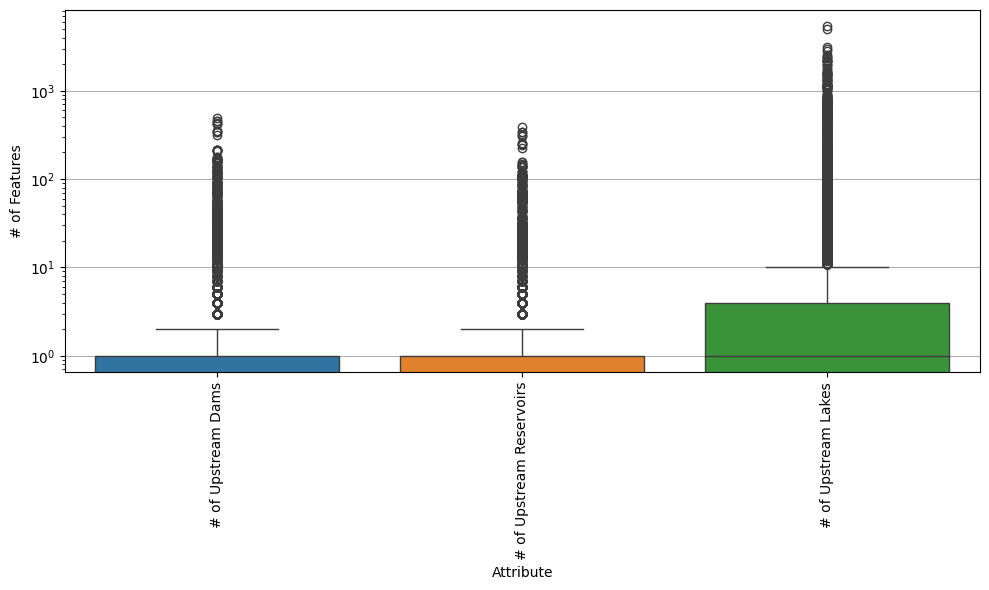

In [9]:
# Create boxplot of features
melted = static_df[num_things_cols].melt(var_name='Attribute', value_name='# of Features')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Attribute', y='# of Features', hue = 'Attribute')
plt.xticks(rotation=90)
plt.yscale('log')
plt.tight_layout()
plt.grid(axis='y')

plt.show()

In [10]:
# Display summary stats for lake info
static_df[storage_cols].describe()

,Total Area of Upstream Lakes,Total Upstream Lake Volume
count,13516.000000,1.351600e+04
mean,54.301458,1.011519e+03
std,583.551797,1.335122e+04
min,0.000000,0.000000e+00
25%,0.000000,0.000000e+00
50%,0.000000,0.000000e+00
75%,2.670000,2.202250e+01
max,45825.360000,1.301789e+06


#### Hydrology & Meteorology

Next, we'll just look at the other meteological features in general.

In [11]:
# Identify numerical meteorological columns
meteo_cols = [
    'Ratio of Mean Daily Streamflow/Precipitation',
    'Streamflow Precipitation Elasticity',
    '5% Flow Quantile (mm/day)',
    '95% Flow Quantile (mm/day)',
    'Days/Year with No Flow',
    'Mean Daily Precipitation (mm/day)',
    'Mean Daily PET (mm/day)',
    'Ratio of PET/Precipitation',
    'Fraction of Snow on Days <0 C',
    'Days/Year of High Precipitation',
    'Avg Duration of High Precipitation',
    'Days/Year of Low Precipitation',
    'Avg Duration of Low Precipitation',
]

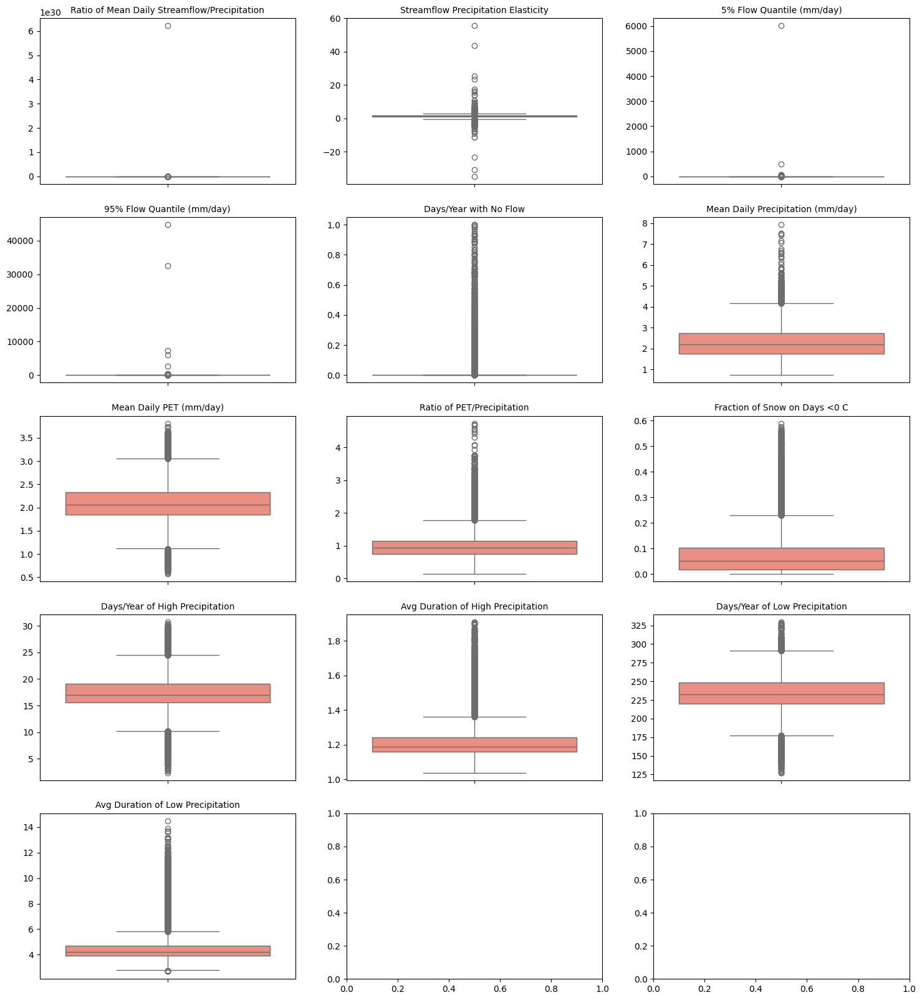

In [12]:
# Identify num of rows and col for boxplot grid
n_cols = 3
n_rows = (len(meteo_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 4))
axes = axes.flatten()

# Plot boxplots
for i, col in enumerate(meteo_cols):
    ax = axes[i]
    sns.boxplot(data=static_df, y=col, ax=ax, color = 'salmon')  # or add `x='region'` if needed
    ax.set_title(col, fontsize=10)
    ax.set_xlabel("")
    ax.set_ylabel("")

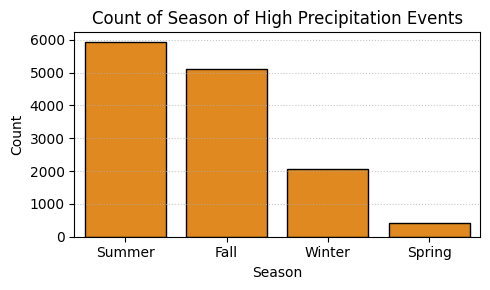

In [13]:
# Plot bar plot of high precip month
plt.figure(figsize=(5, 3))
sns.countplot(data=static_df, x='Season of High Precipitation Events',
              order=static_df['Season of High Precipitation Events'].value_counts().index,
              color = 'darkorange', edgecolor = 'k')
plt.title('Count of Season of High Precipitation Events')
plt.xlabel('Season')
plt.ylabel('Count')
plt.grid(axis = 'y', alpha = 0.7, linestyle = ':')
plt.tight_layout()
plt.show()

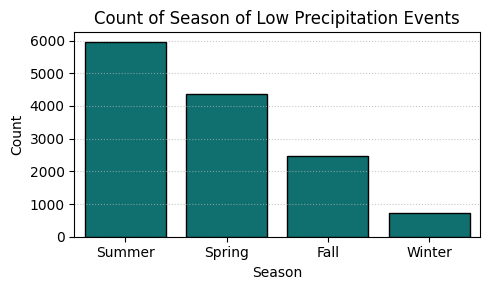

In [14]:
# Plot bar plot of low precip month
plt.figure(figsize=(5, 3))
sns.countplot(data=static_df, x='Season of Low Precipitation Events',
              order=static_df['Season of Low Precipitation Events'].value_counts().index,
              color = 'teal', edgecolor = 'k')
plt.title('Count of Season of Low Precipitation Events')
plt.xlabel('Season')
plt.ylabel('Count')
plt.grid(axis = 'y', alpha = 0.7, linestyle = ':')
plt.tight_layout()
plt.show()

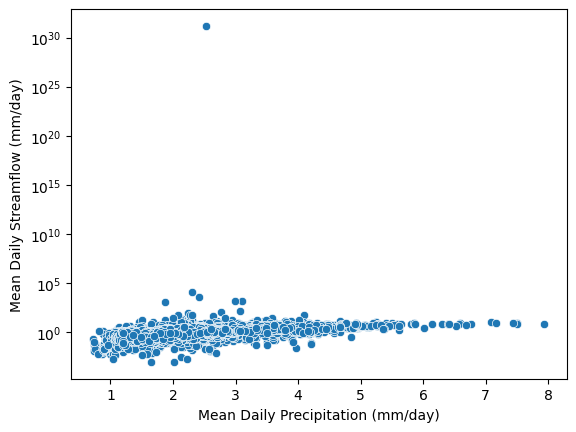

In [15]:
# Initial scatterplot of mean discharge vs mean precipitation
sns.scatterplot(data = static_df,
                y = 'Mean Daily Streamflow (mm/day)',
                x = 'Mean Daily Precipitation (mm/day)')
plt.yscale('log')
plt.show()

Whoops! So clearly there are outliers for streamflow. They are likely due to an incorrect data entry or something similar, so we'll just remove data that is unrealistic.

In [16]:
# log transform
static_df['Mean Daily Streamflow (log)'] = np.log(static_df['Mean Daily Streamflow (mm/day)'] + 1e-6)

# 2. Compute mean and standard deviation of the logged values
mu   = static_df['Mean Daily Streamflow (log)'].mean()
sigma = static_df['Mean Daily Streamflow (log)'].std()

# 3. Filter to keep only rows within ±3σ
mask = (static_df['Mean Daily Streamflow (log)'] >= mu - 3*sigma) & (static_df['Mean Daily Streamflow (log)'] <= mu + 3*sigma)
static_df = static_df.loc[mask].copy()

In [17]:
static_df

,Basin ID,% Evaporites,% Ice and Glaciers,% Metamorphics,% No Data,% Acid Plutonic Rocks,% Basic Putonic Rocks,% ntermedite Plutonic Rocks,% Pyroclastics,% Carbonate Sedimentary Rocks,% Mixed Sedimentary Rocks,% Siliciclastic Sedimentary Rocks,% Unconsolidated Sediments,% Acid Volcanic Rocks,% Basic Volcanic Rocks,% Intermediate Volcanic Rocks,% Water Bodies,Lithological Dominant Class,% of Watershed in GLiM,Depth to Bedrock,# of Upstream Dams,# of Upstream Reservoirs,# of Upstream Lakes,Total Area of Upstream Lakes,Total Upstream Lake Volume,Mean Daily Streamflow (mm/day),Ratio of Mean Daily Streamflow/Precipitation,Streamflow Precipitation Elasticity,5% Flow Quantile (mm/day),95% Flow Quantile (mm/day),Days/Year with No Flow,Mean Daily Precipitation (mm/day),Mean Daily PET (mm/day),Ratio of PET/Precipitation,Seasonality/Timing of Precipitation,Fraction of Snow on Days <0 C,Days/Year of High Precipitation,Avg Duration of High Precipitation,Season of High Precipitation Events,Days/Year of Low Precipitation,Avg Duration of Low Precipitation,Season of Low Precipitation Events,# of Years with Hydrological Observations,First Date with Hydrological Observations,End Date of Hydrological Observations,# of Years with Meteorological Observations,First Date with Meteorological Observations,End Date of Meteorological Observations,Mean Root Depth (cm),Max Root Depth (cm),Min Root Depth (cm),5% Quantile Root Depth (cm),25% Quantile Root Depth (cm),50% Quantile Root Depth (cm),75% Quantile Root Depth (cm),90% Quantile Root Depth (cm),Mean Available Water Content (mm),Max Available Water Content (mm),Min Available Water Content (mm),5% Quantile Water Content (mm),25% Quantile Water Content (mm),50% Quantile Water Content (mm),75% Quantile Water Content (mm),90% Quantile Water Content (mm),Mean % Sand in Soil,Max % Sand in Soil,Min % Sand in Soil,5% Quantile % Sand in Soil,25% Quantile % Sand in Soil,50% Quantile % Sand in Soil,75% Quantile % Sand in Soil,90% Quantile % Sand in Soil,Mean % Silt in Soil,Max % Silt in Soil,Min % Silt in Soil,5% Quantile % Silt in Soil,25% Quantile % Silt in Soil,50% Quantile % Silt in Soil,75% Quantile % Silt in Soil,90% Quantile % Silt in Soil,Mean % Clay in Soil,Max % Clay in Soil,Min % Clay in Soil,5% Quantile % Clay in Soil,25% Quantile % Clay in Soil,50% Quantile % Clay in Soil,75% Quantile % Clay in Soil,90% Quantile % Clay in Soil,Mean % Gravel in Soil,Max % Gravel in Soil,Min % Gravel in Soil,5% Quantile % Gravel in Soil,25% Quantile % Gravel in Soil,50% Quantile % Gravel in Soil,75% Quantile % Gravel in Soil,90% Quantile % Gravel in Soil,Mean Soil Bulk Density (g/cm3),Max Soil Bulk Density (g/cm3),Min Soil Bulk Density (g/cm3),5% Quantile Soil Bulk Density (g/cm3),25% Quantile Soil Bulk Density (g/cm3),50% Quantile Soil Bulk Density (g/cm3),75% Quantile Soil Bulk Density (g/cm3),90% Quantile Soil Bulk Density (g/cm3),Mean % Soil Organic Material,Max % Soil Organic Material,Min % Soil Organic Material,5% Quantile % Soil Organic Material,25% Quantile % Soil Organic Material,50% Quantile % Soil Organic Material,75% Quantile % Soil Organic Material,90% Quantile % Soil Organic Material,Max Elevation (m),Mean Elevation (m),Min Elevation (m),Mean Terrain Slope (Degrees),% of Watershed Slope <3 Degrees,% of Watershed Slope >15 Degrees,Elongation Ratio,Stream Density (1000km/km2),Mean Jan Leaf-Area Index,Mean Feb Leaf-Area Index,Mean Mar Leaf-Area Index,Mean Apr Leaf-Area Index,Mean May Leaf-Area Index,Mean Jun Leaf-Area Index,Mean Jul Leaf-Area Index,Mean Aug Leaf-Area Index,Mean Sep Leaf-Area Index,Mean Oct Leaf-Area Index,Mean Nov Leaf-Area Index,Mean Dec Leaf-Area Index,Mean Leaf-Area Index,Mean Jan NDVI,Mean Feb NDVI,Mean Mar NDVI,Mean Apr NDVI,Mean May NDVI,Mean Jun NDVI,Mean Jul NDVI,Mean Aug NDVI,Mean Sep NDVI,Mean Oct NDVI,Mean Nov NDVI,Mean NDVI,Mean Daily Streamflow (log)
0,AT000001,0.0,0.553,23.464,0.0,2.657,0.042,0.19,0.0,38.753,5.521,3.888,22.064,0.776,1.858,0.0,0.0,sc,100.0,1.124,23,10,10,6.62,54

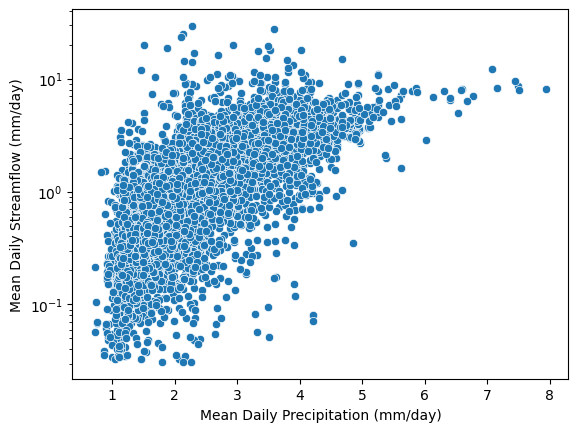

In [18]:
# Again: scatterplot of mean discharge vs mean precipitation
sns.scatterplot(data = static_df,
                y = 'Mean Daily Streamflow (mm/day)',
                x = 'Mean Daily Precipitation (mm/day)')
plt.yscale('log')
plt.show()

#### Soil Static Attributes

In [19]:
# Identify columns of interest
root_depth_cols = [
    'Mean Root Depth (cm)',
    'Max Root Depth (cm)',
    'Min Root Depth (cm)',
    '5% Quantile Root Depth (cm)',
    '25% Quantile Root Depth (cm)',
    '50% Quantile Root Depth (cm)',
    '75% Quantile Root Depth (cm)',
    '90% Quantile Root Depth (cm)'
]

water_content_cols = [
    'Mean Available Water Content (mm)',
    'Max Available Water Content (mm)',
    'Min Available Water Content (mm)',
    '5% Quantile Water Content (mm)',
    '25% Quantile Water Content (mm)',
    '50% Quantile Water Content (mm)',
    '75% Quantile Water Content (mm)',
    '90% Quantile Water Content (mm)'
]

sand_cols = [
    'Mean % Sand in Soil',
    'Max % Sand in Soil',
    'Min % Sand in Soil',
    '5% Quantile % Sand in Soil',
    '25% Quantile % Sand in Soil',
    '50% Quantile % Sand in Soil',
    '75% Quantile % Sand in Soil',
    '90% Quantile % Sand in Soil'
]

silt_cols = [
    'Mean % Silt in Soil',
    'Max % Silt in Soil',
    'Min % Silt in Soil',
    '5% Quantile % Silt in Soil',
    '25% Quantile % Silt in Soil',
    '50% Quantile % Silt in Soil',
    '75% Quantile % Silt in Soil',
    '90% Quantile % Silt in Soil'
]

clay_cols = [
    'Mean % Clay in Soil',
    'Max % Clay in Soil',
    'Min % Clay in Soil',
    '5% Quantile % Clay in Soil',
    '25% Quantile % Clay in Soil',
    '50% Quantile % Clay in Soil',
    '75% Quantile % Clay in Soil',
    '90% Quantile % Clay in Soil'
]

gravel_cols = [
    'Mean % Gravel in Soil',
    'Max % Gravel in Soil',
    'Min % Gravel in Soil',
    '5% Quantile % Gravel in Soil',
    '25% Quantile % Gravel in Soil',
    '50% Quantile % Gravel in Soil',
    '75% Quantile % Gravel in Soil',
    '90% Quantile % Gravel in Soil'
]

bulk_dens_cols = [
    'Mean Soil Bulk Density (g/cm3)',
    'Max Soil Bulk Density (g/cm3)',
    'Min Soil Bulk Density (g/cm3)',
    '5% Quantile Soil Bulk Density (g/cm3)',
    '25% Quantile Soil Bulk Density (g/cm3)',
    '50% Quantile Soil Bulk Density (g/cm3)',
    '75% Quantile Soil Bulk Density (g/cm3)',
    '90% Quantile Soil Bulk Density (g/cm3)'
]

om_cols = [
    'Mean % Soil Organic Material',
    'Max % Soil Organic Material',
    'Min % Soil Organic Material',
    '5% Quantile % Soil Organic Material',
    '25% Quantile % Soil Organic Material',
    '50% Quantile % Soil Organic Material',
    '75% Quantile % Soil Organic Material',
    '90% Quantile % Soil Organic Material'
]


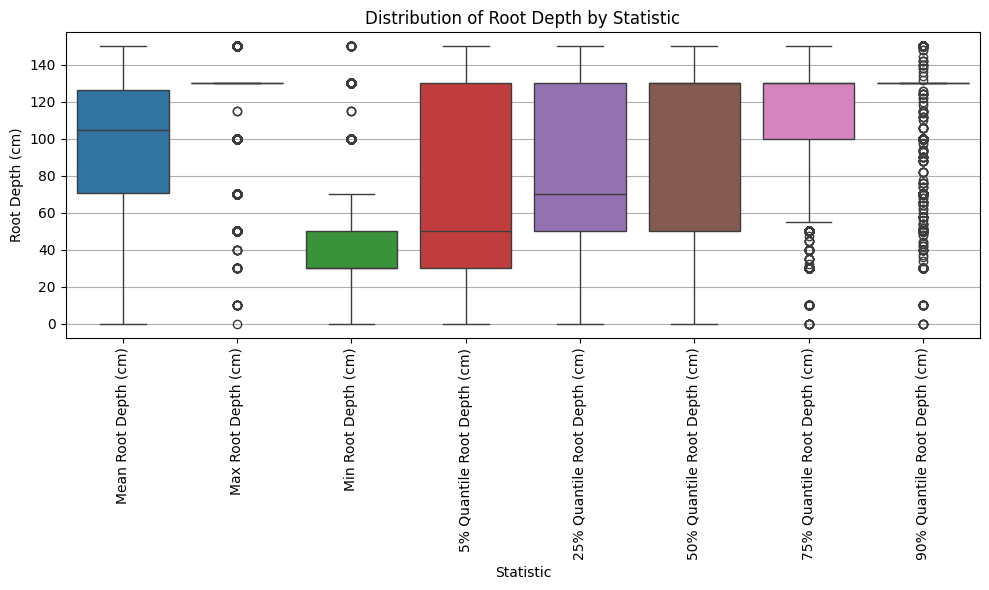

In [20]:
# Create boxplot of root depth stats
melted = static_df[root_depth_cols].melt(var_name='Statistic', value_name='Root Depth (cm)')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='Root Depth (cm)', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of Root Depth by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

The mean root depth column looks good!

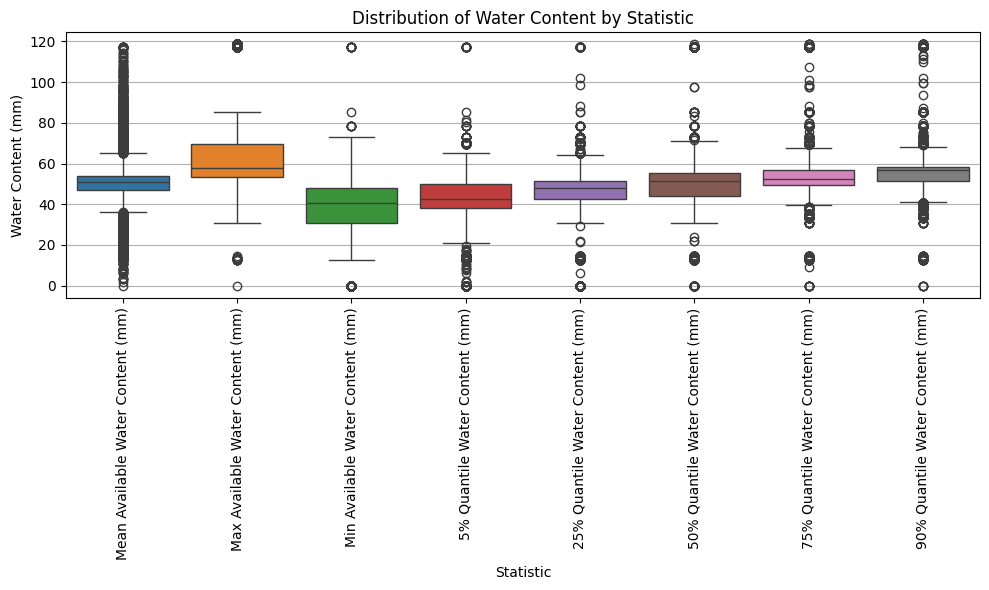

In [21]:
# Create boxplot of water content stats
melted = static_df[water_content_cols].melt(var_name='Statistic', value_name='Water Content (mm)')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='Water Content (mm)', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of Water Content by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

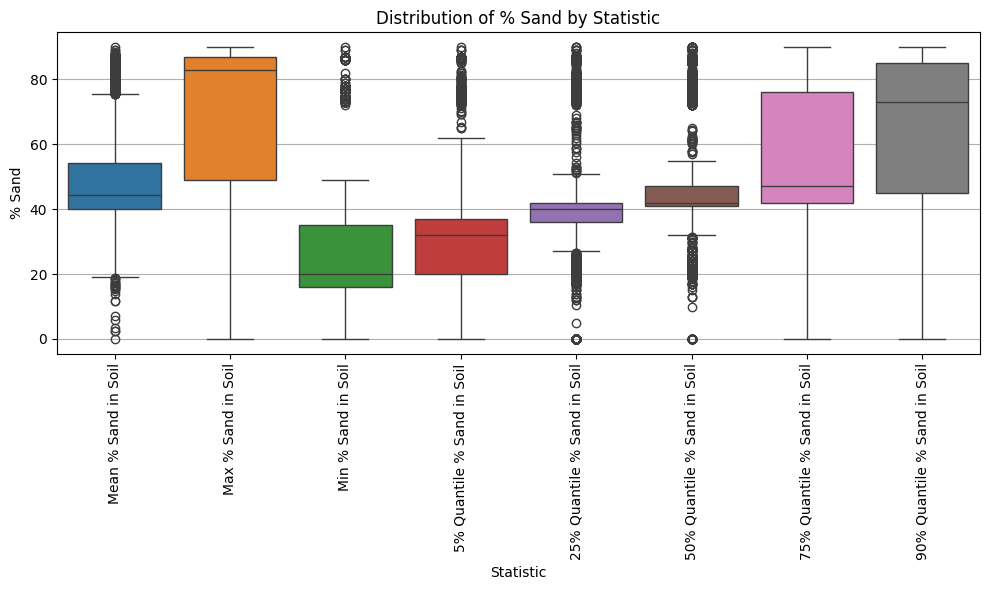

In [22]:
# Create boxplot of % sand stats
melted = static_df[sand_cols].melt(var_name='Statistic', value_name='% Sand')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='% Sand', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of % Sand by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

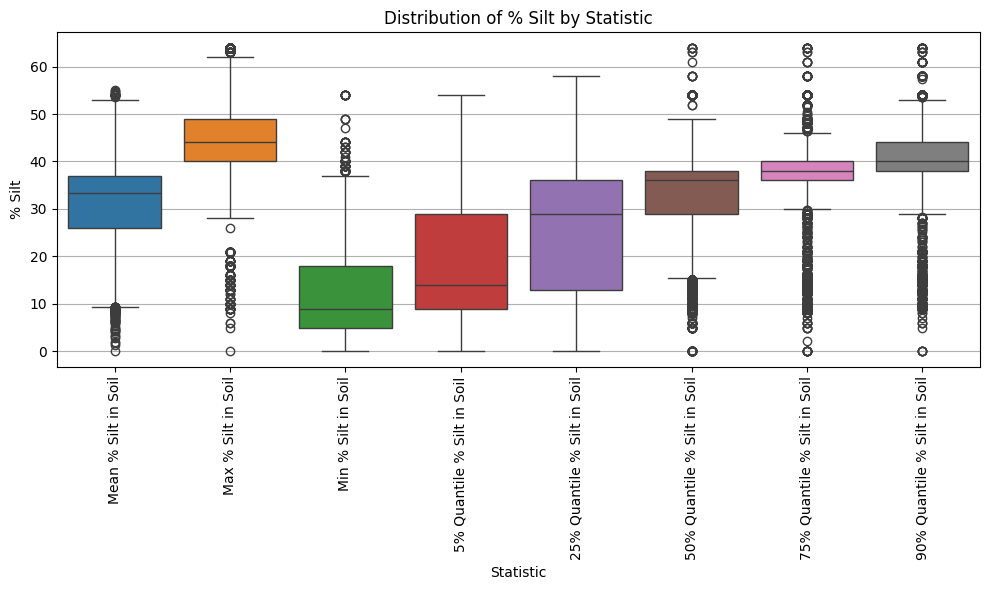

In [23]:
# Create boxplot of % silt stats
melted = static_df[silt_cols].melt(var_name='Statistic', value_name='% Silt')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='% Silt', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of % Silt by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

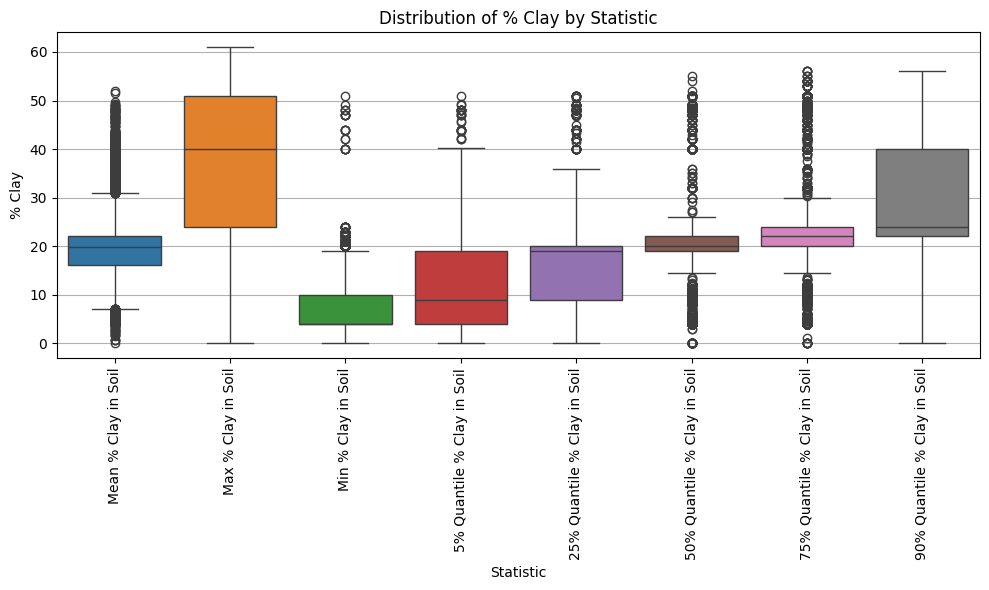

In [24]:
# Create boxplot of % clay stats
melted = static_df[clay_cols].melt(var_name='Statistic', value_name='% Clay')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='% Clay', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of % Clay by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

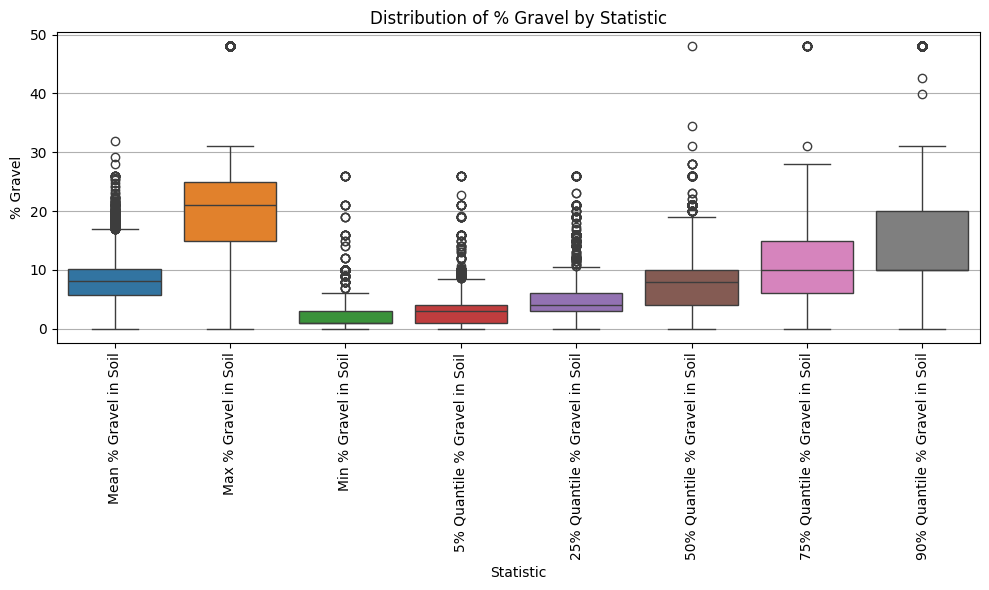

In [25]:
# Create boxplot of % gravel stats
melted = static_df[gravel_cols].melt(var_name='Statistic', value_name='% Gravel')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='% Gravel', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of % Gravel by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

**Major Takeaway:** Sand is the dominant particle size for this dataset.

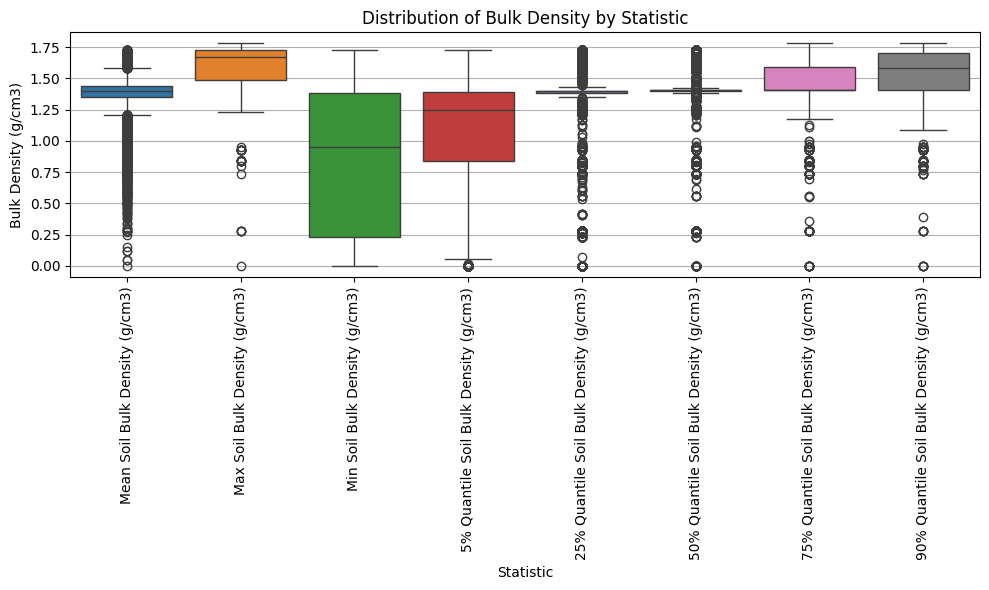

In [26]:
# Create boxplot of bulk density stats
melted = static_df[bulk_dens_cols].melt(var_name='Statistic', value_name='Bulk Density (g/cm3)')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='Bulk Density (g/cm3)', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of Bulk Density by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

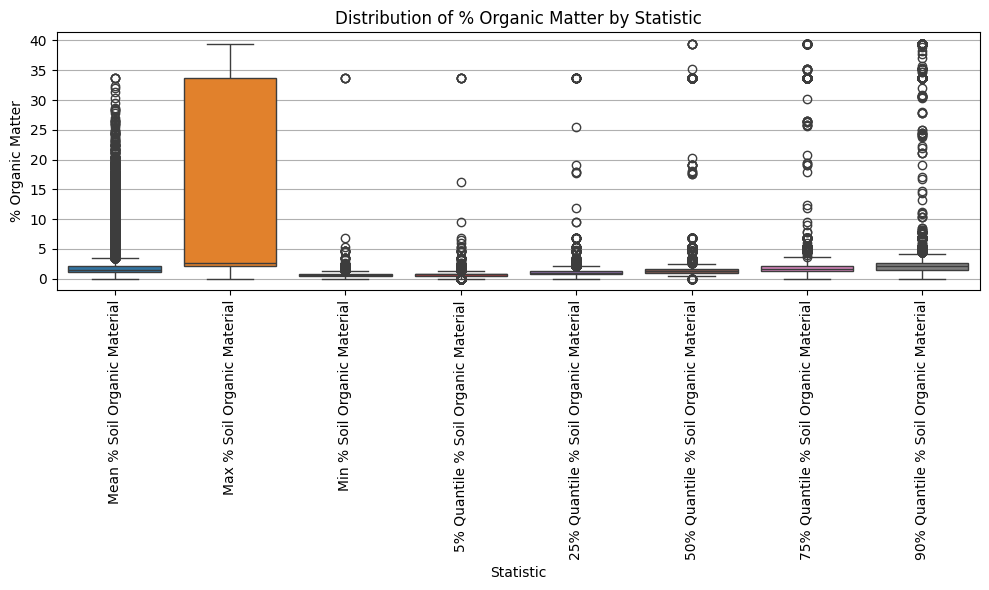

In [27]:
# Create boxplot of organic matter stats
melted = static_df[om_cols].melt(var_name='Statistic', value_name='% Organic Matter')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Statistic', y='% Organic Matter', hue = 'Statistic')
plt.xticks(rotation=90)
plt.title('Distribution of % Organic Matter by Statistic')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

#### Topography

In [28]:
# Identify columns of interest
topo_cols = [
    'Max Elevation (m)',
    'Mean Elevation (m)',
    'Min Elevation (m)',
    'Mean Terrain Slope (Degrees)',
    '% of Watershed Slope <3 Degrees',
    '% of Watershed Slope >15 Degrees',
    'Elongation Ratio',
    'Stream Density (1000km/km2)'
]

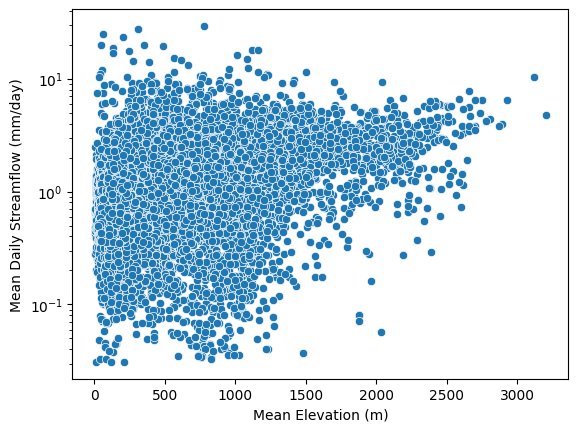

In [29]:
# scatterplot of mean discharge vs mean elevation
sns.scatterplot(data = static_df,
                y = 'Mean Daily Streamflow (mm/day)',
                x = 'Mean Elevation (m)')
plt.yscale('log')
plt.show()

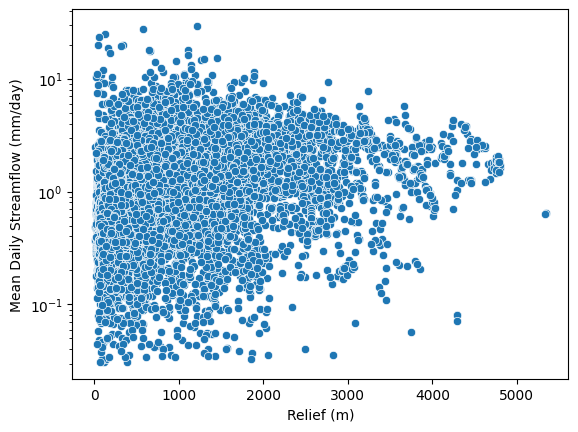

In [30]:
# Create a Relief (max - min elev) col
static_df['Relief (m)'] = static_df['Max Elevation (m)'] - static_df['Min Elevation (m)']

# scatterplot of mean discharge vs relief
sns.scatterplot(data = static_df,
                y = 'Mean Daily Streamflow (mm/day)',
                x = 'Relief (m)')
plt.yscale('log')
plt.show()

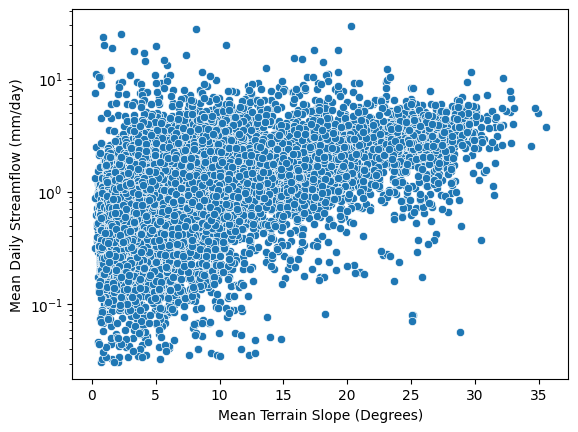

In [31]:
# scatterplot of mean discharge vs mean slope
sns.scatterplot(data = static_df,
                y = 'Mean Daily Streamflow (mm/day)',
                x = 'Mean Terrain Slope (Degrees)')
plt.yscale('log')
plt.show()

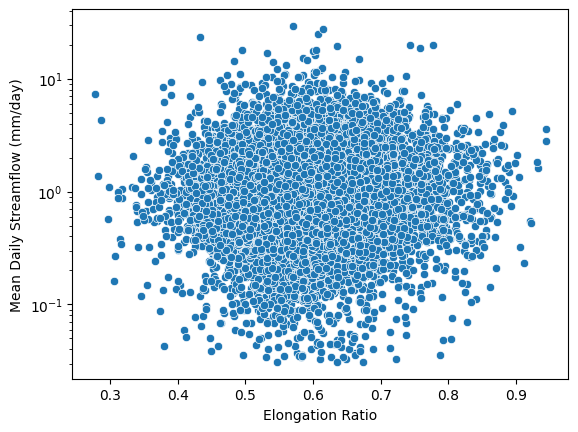

In [32]:
# scatterplot of mean discharge vs elongation ratio
sns.scatterplot(data = static_df,
                y = 'Mean Daily Streamflow (mm/day)',
                x = 'Elongation Ratio')
plt.yscale('log')
plt.show()

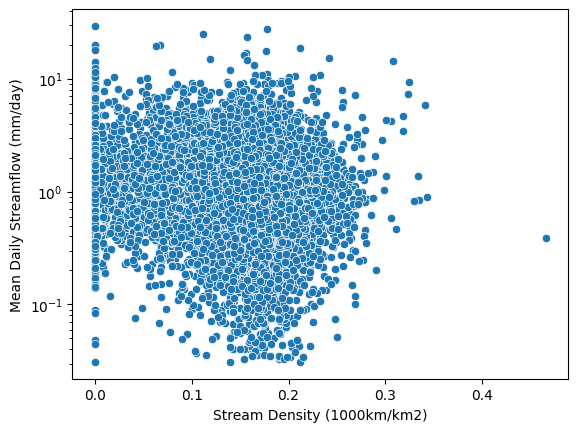

In [33]:
# scatterplot of mean discharge vs mean slope
sns.scatterplot(data = static_df,
                y = 'Mean Daily Streamflow (mm/day)',
                x = 'Stream Density (1000km/km2)')
plt.yscale('log')
plt.show()

#### Vegetation

In [34]:
# Identify columns of interest
lai_cols = [
    'Mean Jan Leaf-Area Index',
    'Mean Feb Leaf-Area Index',
    'Mean Mar Leaf-Area Index',
    'Mean Apr Leaf-Area Index',
    'Mean May Leaf-Area Index',
    'Mean Jun Leaf-Area Index',
    'Mean Jul Leaf-Area Index',
    'Mean Aug Leaf-Area Index',
    'Mean Sep Leaf-Area Index',
    'Mean Oct Leaf-Area Index',
    'Mean Nov Leaf-Area Index',
    'Mean Dec Leaf-Area Index',
    'Mean Leaf-Area Index',
]

ndvi_cols = [
    'Mean Jan NDVI',
    'Mean Feb NDVI',
    'Mean Mar NDVI',
    'Mean Apr NDVI',
    'Mean May NDVI',
    'Mean Jun NDVI',
    'Mean Jul NDVI',
    'Mean Aug NDVI',
    'Mean Sep NDVI',
    'Mean Oct NDVI',
    'Mean Nov NDVI',
    'Mean NDVI'
]

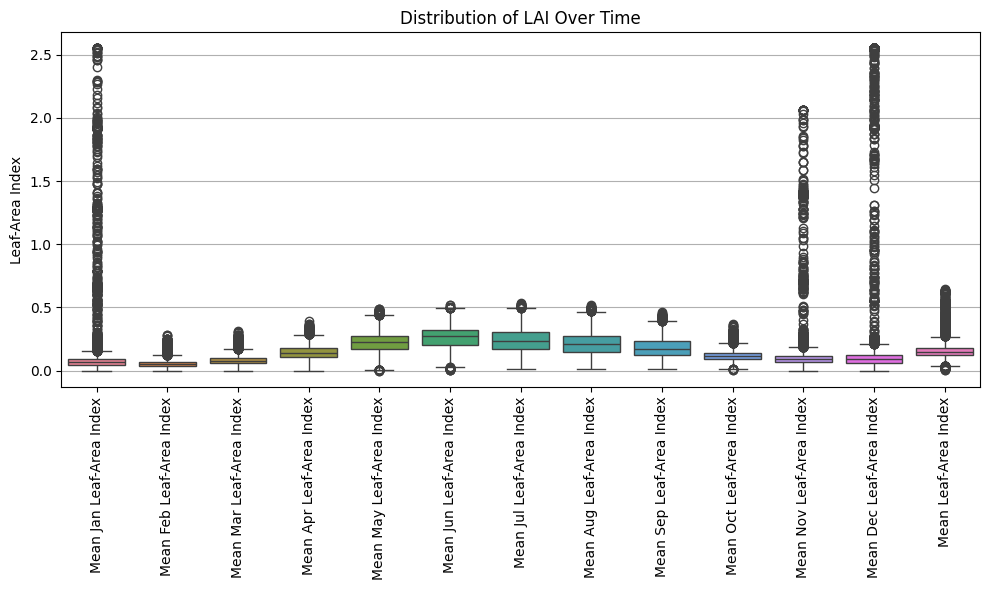

In [35]:
# Create boxplot of LAI
melted = static_df[lai_cols].melt(var_name='Month', value_name='Leaf-Area Index')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Month', y='Leaf-Area Index', hue = 'Month')
plt.xlabel('')
plt.xticks(rotation=90)
plt.title('Distribution of LAI Over Time')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

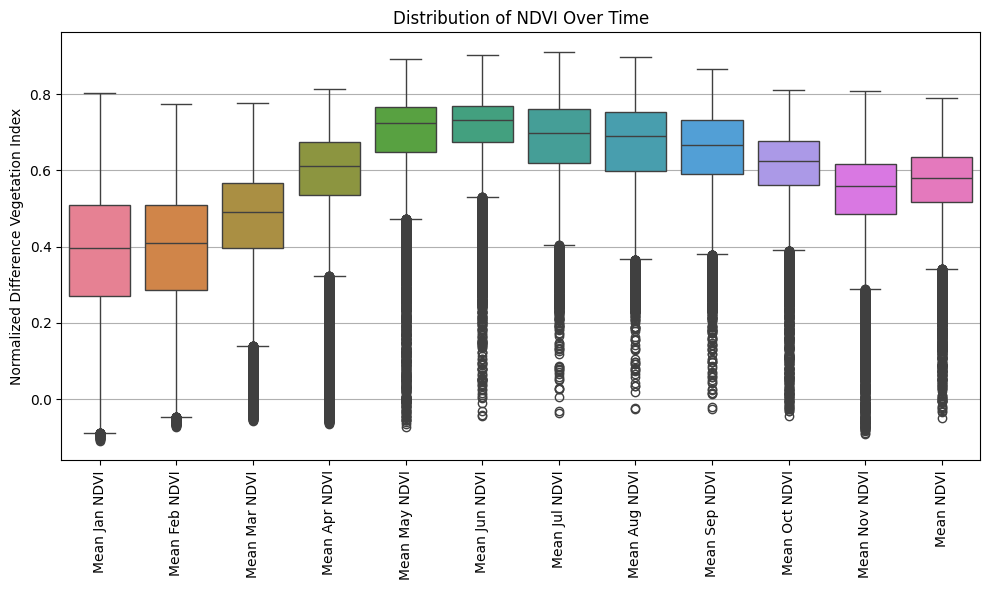

In [36]:
# Create boxplot of NDVI types
melted = static_df[ndvi_cols].melt(var_name='Month', value_name='Normalized Difference Vegetation Index')
plt.figure(figsize=(10, 6))
sns.boxplot(data=melted, x='Month', y='Normalized Difference Vegetation Index', hue = 'Month')
plt.xlabel('')
plt.xticks(rotation=90)
plt.title('Distribution of NDVI Over Time')
plt.tight_layout()
plt.grid(axis = 'y')

plt.show()

### Step 2b. Clustering EDA
Since clustering is an unsupervised algorithm, there won't be any set way to measure the success of the clustering nor the best selected features. Therefore, we will try to (reasonably) include the most varaibles possible. We can use dimensionality reduction for this.

#### Principal Component Analysis

We will pick only 40 variables. Since we're focusing on hydrological regimes, we will first organize by correlation to mean daily streamflow, then create a correlation matrix between all variables. We will then select the variable with the highest correlation, and cut all other variables.

In [86]:
def select_decorrelated_features(
    df: pd.DataFrame,
    target_col: str,
    final_n: int = 30,
    corr_threshold: float = 0.8
) -> pd.DataFrame:
    """
    1. Compute absolute correlation of each feature with the target (all cols).
    2. Compute pairwise correlation matrix among those features.
    3. Iteratively lock in highest target-corr feature and drop any others
       whose mutual correlation exceeds corr_threshold.
    4. At the end, keep only the first `final_n` features from that list.

    Returns: DataFrame with selected features + target.
    """
    # 1. Correlation with target for all features
    corr_with_target = df.corr()[target_col].abs().drop(target_col)

    # 2. Pairwise correlations among all features
    features = list(corr_with_target.index)
    pairwise_corr = df[features].corr().abs()

    # 3. Iterative selection across full set
    selected = []
    remaining = set(features)
    # sort features by descending target correlation
    feature_order = corr_with_target.sort_values(ascending=False).index.tolist()

    for feat in feature_order:
        if feat not in remaining:
            continue
        selected.append(feat)
        # drop any remaining features too correlated with this one
        to_drop = {
            other for other in remaining
            if other != feat and pairwise_corr.loc[feat, other] > corr_threshold
        }
        remaining -= to_drop | {feat}

    # 4. Finally, truncate to final_n
    final_features = selected[:final_n]
    if len(final_features) < final_n:
        print(f"Warning: only {len(final_features)} features selected (<{final_n}).")

    return df[final_features + [target_col]]

# Make a reduced df
numeric_df = static_df.dropna(axis='rows').select_dtypes(include='number')
reduced_df = select_decorrelated_features(
    numeric_df,
    target_col='Mean Daily Streamflow (mm/day)',
    final_n=30,
    corr_threshold=0.8
)

# Pull Basin ID from the original df
basin_ids = static_df.loc[reduced_df.index, ['Basin ID']]
# join them side-by-side
reduced_df = basin_ids.join(reduced_df)

# Display final df
reduced_df = reduced_df.drop(columns = 'Mean Daily Streamflow (mm/day)')
reduced_df

,Basin ID,95% Flow Quantile (mm/day),Mean Daily Streamflow (log),Mean Daily Precipitation (mm/day),5% Flow Quantile (mm/day),Ratio of PET/Precipitation,Mean Terrain Slope (Degrees),Days/Year of Low Precipitation,Mean Root Depth (cm),Mean Apr NDVI,90% Quantile Root Depth (cm),Relief (m),Min Elevation (m),Mean Daily PET (mm/day),5% Quantile Root Depth (cm),Depth to Bedrock,Max Root Depth (cm),Mean % Gravel in Soil,Mean Aug Leaf-Area Index,Max % Clay in Soil,% Unconsolidated Sediments,Mean Soil Bulk Density (g/cm3),Mean Jan NDVI,Stream Density (1000km/km2),% Basic Volcanic Rocks,25% Quantile % Gravel in Soil,5% Quantile Water Content (mm),Max % Silt in Soil,90% Quantile % Clay in Soil,50% Quantile Soil Bulk Density (g/cm3),25% Quantile Water Content (mm)
0,AT000001,6.607,1.038155,3.797,1.029,0.395,24.122,198.993,81.571,0.191,130.0,3134.786,420.622,1.499,0.0,1.124,130.0,9.062,0.204,40.0,22.064,1.303,0.045,0.151,1.858,1.0,0.000,64.0,19.0,1.59,12.567
1,AT000002,10.727,1.360464,3.912,0.980,0.390,26.095,204.041,58.600,0.161,70.0,2129.775,674.209,1.526,30.0,0.565,70.0,8.140,0.199,20.0,0.000,1.502,0.035,0.151,0.000,3.0,42.817,44.0,20.0,1.41,42.817
2,AT000003,2.819,-0.088830,3.693,0.404,0.411,25.735,202.001,51.660,0.142,70.0,2709.544,583.510,1.516,30.0,0.593,130.0,10.294,0.197,51.0,0.070,1.425,0.028,0.141,0.003,6.0,42.817,44.0,24.0,1.41,42.817
3,AT000004,13.295,1.625115,3.767,1.499,0.384,27.324,205.803,49.412,0.063,70.0,1855.709,1022.324,1.445,30.0,0.564,70.0,13.044,0.188,51.0,0.000,1.409,-0.014,0.095,0.000,10.0,43.422,44.0,20.0,1.41,48.174
4,AT000005,7.692,1.199664,4.048,1.064,0.448,28.647,201.796,31.781,0.165,30.0,2371.689,567.275,1.814,30.0,0.445,100.0,17.658,0.183,51.0,0.000,1.384,0.031,0.134,0.000,16.0,31.080,44.0,24.0,1.41,43.422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13511,UAGR0017,0.797,-1.897113,1.622,0.000,1.354,11.810,270.637,128.620,0.539,130.0,1375.879,161.399,2.196,130.0,0.921,130.0,9.939,0.396,48.0,0.000,1.246,0.368,0.129,0.000,10.0,51.053,45.0,48.0,1.25,51.053
13512,UAGR0018,3.631,-0.744438,1.692,0.000,1.270,19.438,268.322,73.061,0.537,130.0,1495.042,16.793,2.148,40.0,0.808,130.0,7.469,0.245,48.0,0.000,1.066,0.374,0.024,0.000,6.0,51.053,45.0,48.0,0.96,51.053
13513,UAGR0019,1.412,-1.164749,1.483,0.000,1.494,9.655,273.598,130.000,0.524,130.0,1142.539,306.877,2.216,130.0,0.942,130.0,10.049,0.284,48.0,0.000,1.251,0.293,0.112,0.000,10.0,51.053,44.0,48.0,1.25,51.053
13514,UAGR0020,0.236,-2.590254,1.200,0.000,1.856,1.223,281.568,130.000,0.450,130.0,262.941,33.055,2.228,130.0,4.069,130.0,4.000,0.069,45.0,0.000,1.303,0.164,0.190,0.000,4.0,50.556,54.0,45.0,1.35,50.556


Now, we will identify the number of components to be used in the final model training.

In [38]:
# Scale data
scaler = StandardScaler()
cluster_data = reduced_df.dropna(axis = 'rows').select_dtypes(include='number')

# Fit and transform to x data
scaled_data = scaler.fit_transform(cluster_data)
scaled_data.shape

(13373, 30)

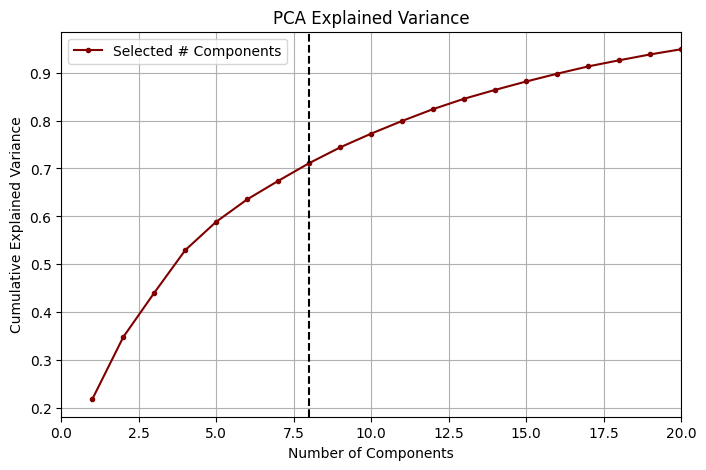

In [85]:
# ----- Explained Variance Plot -----

# Set the number of components
pca = PCA(n_components = 20)
pca.fit(scaled_data)

# Plot the cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1),
         pca.explained_variance_ratio_.cumsum(), marker='.', color = 'maroon', label = 'Selected # Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.xlim([0,20])
plt.axvline(x=8, color = 'k', linestyle = '--')
plt.grid(True)
plt.legend()
plt.show()

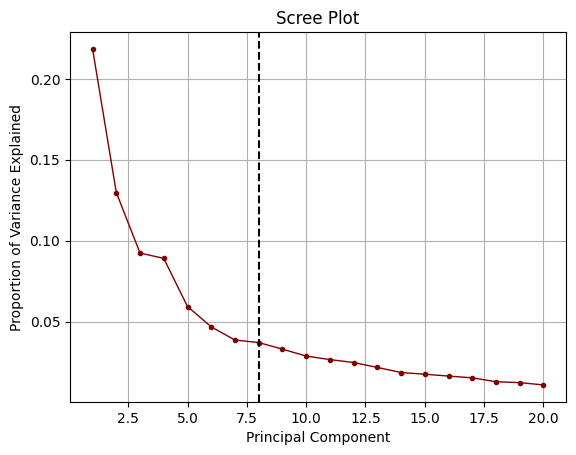

Proportion of Variance Explained :  [0.21852699 0.12974519 0.09232968 0.0890518  0.0592565  0.0467242
 0.03857303 0.03700947 0.03293471 0.02866047 0.02648772 0.02467925
 0.0216286  0.01848257 0.0174332  0.01629241 0.01520088 0.01277615
 0.01223361 0.01081905]
Cumulative Prop. Variance Explained:  [0.21852699 0.34827218 0.44060186 0.52965367 0.58891017 0.63563437
 0.6742074  0.71121688 0.74415159 0.77281206 0.79929978 0.82397903
 0.84560763 0.8640902  0.8815234  0.89781581 0.91301669 0.92579284
 0.93802646 0.94884551]


In [40]:
# ----- Scree Plot ------

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, marker='.', color = 'maroon', linewidth=1)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.axvline(x=8, color = 'k', linestyle = '--')
plt.grid()
plt.show()

print ("Proportion of Variance Explained : ", pca.explained_variance_ratio_)

out_sum = np.cumsum(pca.explained_variance_ratio_)
print ("Cumulative Prop. Variance Explained: ", out_sum)

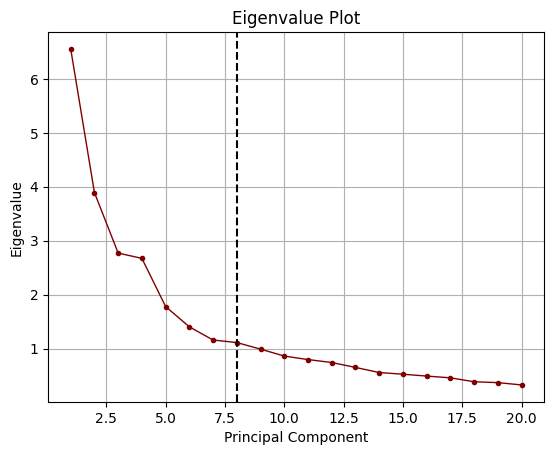

In [41]:
# ------ Eigenvalue Plot -----
# Look for when Eigenvalue dips below 1

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_, marker='.', color = 'maroon', linewidth=1)
plt.axvline(x=8, color = 'k', linestyle = '--')
plt.title('Eigenvalue Plot')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

Great! We're going to move forward with **8 principal components.** We will apply the pca in the actual Jupyter notebook for model training, so for now, we will export the dataset with 30 columns to the repo.

In [87]:
# Check dataframe
reduced_df

,Basin ID,95% Flow Quantile (mm/day),Mean Daily Streamflow (log),Mean Daily Precipitation (mm/day),5% Flow Quantile (mm/day),Ratio of PET/Precipitation,Mean Terrain Slope (Degrees),Days/Year of Low Precipitation,Mean Root Depth (cm),Mean Apr NDVI,90% Quantile Root Depth (cm),Relief (m),Min Elevation (m),Mean Daily PET (mm/day),5% Quantile Root Depth (cm),Depth to Bedrock,Max Root Depth (cm),Mean % Gravel in Soil,Mean Aug Leaf-Area Index,Max % Clay in Soil,% Unconsolidated Sediments,Mean Soil Bulk Density (g/cm3),Mean Jan NDVI,Stream Density (1000km/km2),% Basic Volcanic Rocks,25% Quantile % Gravel in Soil,5% Quantile Water Content (mm),Max % Silt in Soil,90% Quantile % Clay in Soil,50% Quantile Soil Bulk Density (g/cm3),25% Quantile Water Content (mm)
0,AT000001,6.607,1.038155,3.797,1.029,0.395,24.122,198.993,81.571,0.191,130.0,3134.786,420.622,1.499,0.0,1.124,130.0,9.062,0.204,40.0,22.064,1.303,0.045,0.151,1.858,1.0,0.000,64.0,19.0,1.59,12.567
1,AT000002,10.727,1.360464,3.912,0.980,0.390,26.095,204.041,58.600,0.161,70.0,2129.775,674.209,1.526,30.0,0.565,70.0,8.140,0.199,20.0,0.000,1.502,0.035,0.151,0.000,3.0,42.817,44.0,20.0,1.41,42.817
2,AT000003,2.819,-0.088830,3.693,0.404,0.411,25.735,202.001,51.660,0.142,70.0,2709.544,583.510,1.516,30.0,0.593,130.0,10.294,0.197,51.0,0.070,1.425,0.028,0.141,0.003,6.0,42.817,44.0,24.0,1.41,42.817
3,AT000004,13.295,1.625115,3.767,1.499,0.384,27.324,205.803,49.412,0.063,70.0,1855.709,1022.324,1.445,30.0,0.564,70.0,13.044,0.188,51.0,0.000,1.409,-0.014,0.095,0.000,10.0,43.422,44.0,20.0,1.41,48.174
4,AT000005,7.692,1.199664,4.048,1.064,0.448,28.647,201.796,31.781,0.165,30.0,2371.689,567.275,1.814,30.0,0.445,100.0,17.658,0.183,51.0,0.000,1.384,0.031,0.134,0.000,16.0,31.080,44.0,24.0,1.41,43.422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13511,UAGR0017,0.797,-1.897113,1.622,0.000,1.354,11.810,270.637,128.620,0.539,130.0,1375.879,161.399,2.196,130.0,0.921,130.0,9.939,0.396,48.0,0.000,1.246,0.368,0.129,0.000,10.0,51.053,45.0,48.0,1.25,51.053
13512,UAGR0018,3.631,-0.744438,1.692,0.000,1.270,19.438,268.322,73.061,0.537,130.0,1495.042,16.793,2.148,40.0,0.808,130.0,7.469,0.245,48.0,0.000,1.066,0.374,0.024,0.000,6.0,51.053,45.0,48.0,0.96,51.053
13513,UAGR0019,1.412,-1.164749,1.483,0.000,1.494,9.655,273.598,130.000,0.524,130.0,1142.539,306.877,2.216,130.0,0.942,130.0,10.049,0.284,48.0,0.000,1.251,0.293,0.112,0.000,10.0,51.053,44.0,48.0,1.25,51.053
13514,UAGR0020,0.236,-2.590254,1.200,0.000,1.856,1.223,281.568,130.000,0.450,130.0,262.941,33.055,2.228,130.0,4.069,130.0,4.000,0.069,45.0,0.000,1.303,0.164,0.190,0.000,4.0,50.556,54.0,45.0,1.35,50.556


#### Final Clustering Dataset

In [88]:
# Export to data folder
cluster_path = os.path.join(BASE_DIR, 'clustering', 'processed_data', 'cluster_model_ready_df.xlsx')
reduced_df.to_excel(cluster_path)
print(f'Dataset saved to {cluster_path}')

Dataset saved to /content/HydroLearners_Proj/clustering/processed_data/cluster_model_ready_df.xlsx


**Note:** For some clustering algorithms, like KMeans, we might want to scale again before implementation.

### Step 2c. Mean Regression EDA
This EDA is specific to the proposed features for the mean regression algorithm. The target is *Mean Daily Streamflow (mm/day)*.

#### Histogram of Target

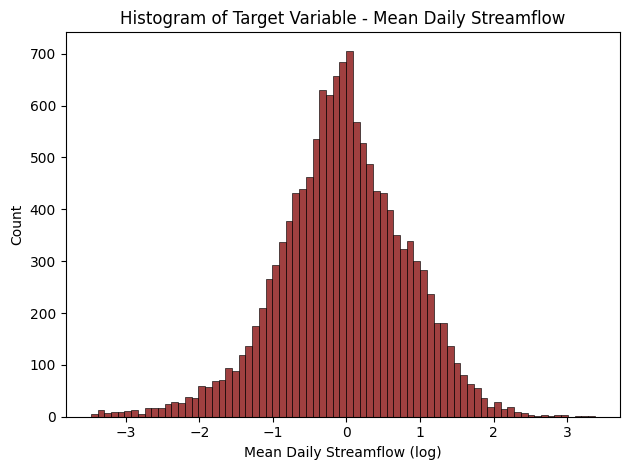

In [44]:
# Create a histogram of target for regression
sns.histplot(data = static_df, x = 'Mean Daily Streamflow (log)',
             color = 'maroon')
plt.title("Histogram of Target Variable - Mean Daily Streamflow")
plt.tight_layout()
plt.show()

Overall, this looks good! This shape is a lot closer to what we were hoping for.

#### Correlation Analysis

Let's start out with some correlation analysis. We will select features based on professional knowledge as well as the Spearman correlation coefficient, which is often helpful in environmental datasets given its monotonic nature.
<br><br> We're also going to calculate the correlations against the transformed target since this is what we will be using in the final model training.

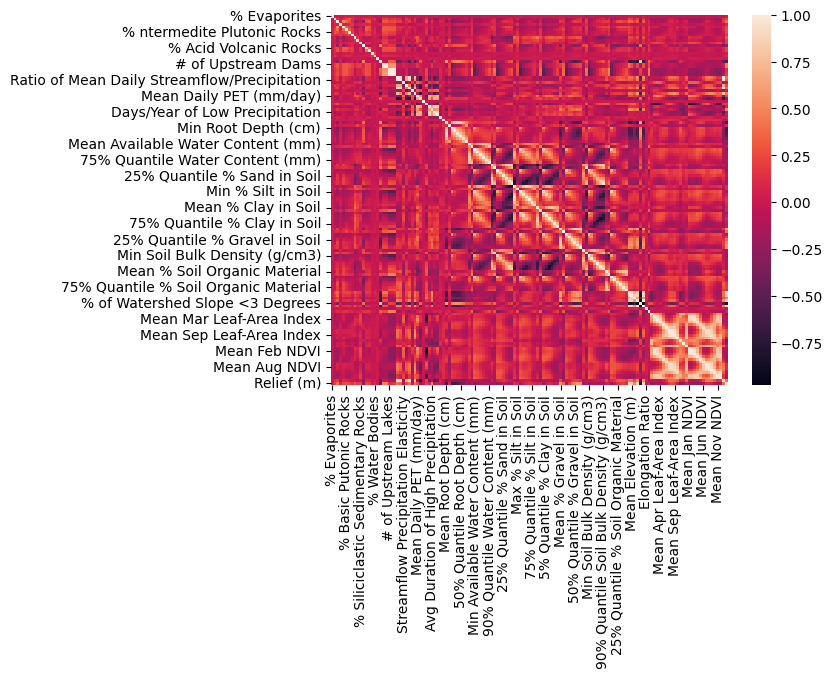

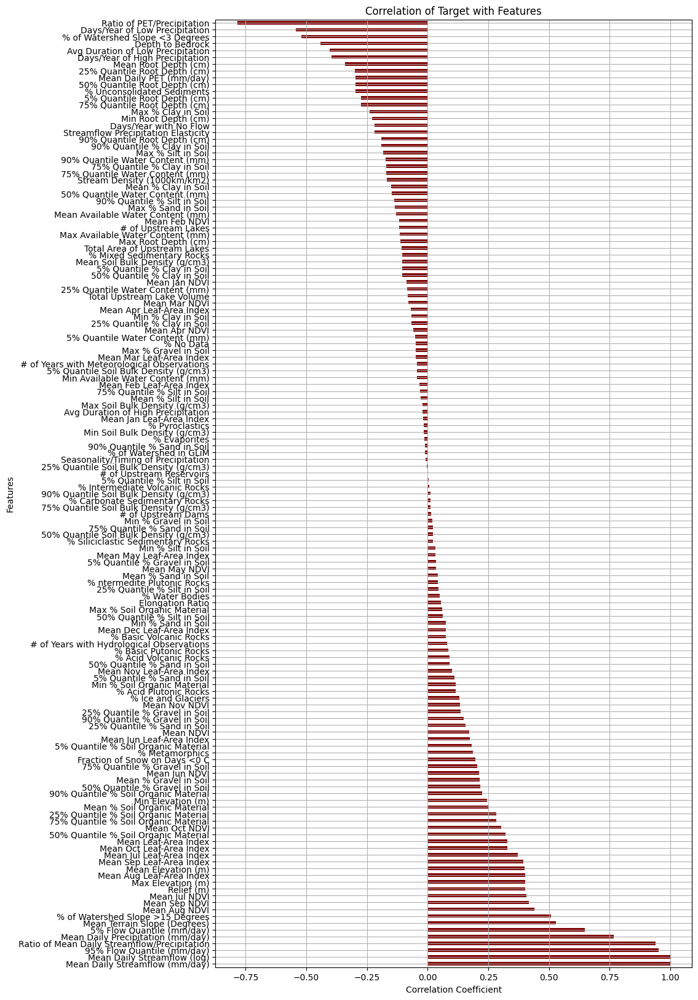

In [45]:
# Create correlation matrix and heatmap

# Select for only numerical values
num_df = static_df.select_dtypes(include='number')
corr = num_df.corr(method = 'spearman')
# Print correlation plot
sns.heatmap(corr)

# Select the target value row
target_corr = corr.loc['Mean Daily Streamflow (log)'].sort_values(ascending = False)

# Plot the horizontal bar plot
plt.figure(figsize=(10, 20))
target_corr.plot(kind='barh', color='maroon')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.title(f'Correlation of Target with Features')
plt.grid()
plt.show()

Great! We're already seeing a lot of high correlations, as well as some we already anticipated. Let's look at the top 60 for now.

In [46]:
# Sort values in correlation matrix
target_corr_abs = target_corr.abs()
target_corr_abs = target_corr_abs.sort_values(ascending = False)

# Pick top 60 from the series
top_corr = target_corr_abs[0:60]
top_corr

,Mean Daily Streamflow (log)
Mean Daily Streamflow (mm/day),1.000000
Mean Daily Streamflow (log),1.000000
95% Flow Quantile (mm/day),0.950929
Ratio of Mean Daily Streamflow/Precipitation,0.939749
Ratio of PET/Precipitation,0.784735
Mean Daily Precipitation (mm/day),0.767079
5% Flow Quantile (mm/day),0.647910
Days/Year of Low Precipitation,0.543466
Mean Terrain Slope (Degrees),0.528721
% of Watershed Slope <3 Degrees,0.519943


Since some columns have multple repeats of a characteristic, such as multiple statistics, we're going to look at a heatmap of correlations to check for multicolinearity.

In [47]:
# Turn identified features into a list
selected_features = top_corr.index.tolist()

# Select correlation matrix for only selected_features
filtered_corr1 = corr.loc[selected_features, selected_features]
top_corrs_df = static_df[selected_features]

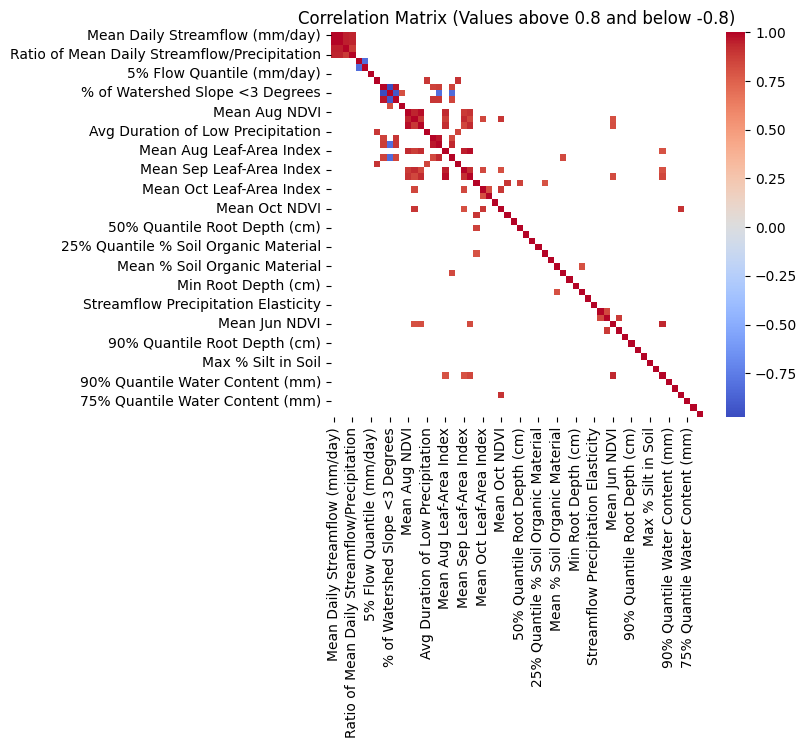

,Mean Daily Streamflow (mm/day),Mean Daily Streamflow (log),95% Flow Quantile (mm/day),Ratio of Mean Daily Streamflow/Precipitation,Ratio of PET/Precipitation,Mean Daily Precipitation (mm/day),5% Flow Quantile (mm/day),Days/Year of Low Precipitation,Mean Terrain Slope (Degrees),% of Watershed Slope <3 Degrees,% of Watershed Slope >15 Degrees,Depth to Bedrock,Mean Aug NDVI,Mean Sep NDVI,Mean Jul NDVI,Avg Duration of Low Precipitation,Relief (m),Max Elevation (m),Mean Aug Leaf-Area Index,Mean Elevation (m),Days/Year of High Precipitation,Mean Sep Leaf-Area Index,Mean Jul Leaf-Area Index,Mean Root Depth (cm),Mean Oct Leaf-Area Index,Mean Leaf-Area Index,50% Quantile % Soil Organic Material,Mean Oct NDVI,25% Quantile Root Depth (cm),Mean Daily PET (mm/day),50% Quantile Root Depth (cm),% Unconsolidated Sediments,75% Quantile % Soil Organic Material,25% Quantile % Soil Organic Material,5% Quantile Root Depth (cm),75% Quantile Root Depth (cm),Mean % Soil Organic Material,Min Elevation (m),Max % Clay in Soil,Min Root Depth (cm),90% Quantile % Soil Organic Material,Days/Year with No Flow,Streamflow Precipitation Elasticity,50% Quantile % Gravel in Soil,Mean % Gravel in Soil,Mean Jun NDVI,75% Quantile % Gravel in Soil,Fraction of Snow on Days <0 C,90% Quantile Root Depth (cm),90% Quantile % Clay in Soil,% Metamorphics,Max % Silt in Soil,5% Quantile % Soil Organic Material,Mean Jun Leaf-Area Index,90% Quantile Water Content (mm),75% Quantile % Clay in Soil,Mean NDVI,75% Quantile Water Content (mm),Stream Density (1000km/km2),25% Quantile % Sand in Soil
Mean Daily Streamflow (mm/day),1.000000,1.000000,0.950929,0.939749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mean Daily Streamflow (log),1.000000,1.000000,0.950929,0.939749,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95% Flow Quantile (mm/day),0.950929,0.950929,1.000000,0.879569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ratio of Mean Daily Streamflow/Precipitation,0.939749,0.939749,0.879569,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ratio of PET/Precipitation,NaN,NaN,NaN,NaN,1.000000,-0.823804,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mean Daily Precipitation (mm/day),NaN,NaN,NaN,NaN,-0.823804,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5% Flow Quantile (mm/day),NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Days/Year of Low Precipitation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.887115,NaN,NaN,NaN,NaN,0.901833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mean Terrain Slope (Degrees),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,-0.975280,0.965516,NaN,NaN,NaN,NaN,NaN,0.860800,0.875509,NaN,0.858664,NaN,Na

In [48]:
# Filter correlation matrix for values above 0.8 and below -0.8
threshold = 0.8
high_corr1 = filtered_corr1[(filtered_corr1 > threshold) | (filtered_corr1 < -threshold)]

# Create heatmap for filtered matrix
plt.figure(figsize=(6,5))
sns.heatmap(high_corr1,
            cmap = 'coolwarm')
plt.title(f'Correlation Matrix (Values above {threshold} and below -{threshold})')
plt.show()

# Print correlation values
high_corr1

In [49]:
# Unstack the matrix to get pairwise correlations
high_corr_pairs = high_corr1.unstack().dropna()

# Remove duplicates
high_corr_pairs = high_corr_pairs[high_corr_pairs.index.get_level_values(0) != high_corr_pairs.index.get_level_values(1)]
high_corr_pairs = high_corr_pairs[~high_corr_pairs.index.duplicated()]

# Sort by absolute correlation
high_corr_pairs = high_corr_pairs.reindex(high_corr_pairs.abs().sort_values(ascending=False).index)

# Temporarily increase display limit
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(high_corr_pairs)

Mean Daily Streamflow (mm/day)                Mean Daily Streamflow (log)                     1.000000
Mean Daily Streamflow (log)                   Mean Daily Streamflow (mm/day)                  1.000000
Mean Jul NDVI                                 Mean Aug NDVI                                   0.981560
Mean Aug NDVI                                 Mean Jul NDVI                                   0.981560
Mean Jul Leaf-Area Index                      Mean Aug Leaf-Area Index                        0.979885
Mean Aug Leaf-Area Index                      Mean Jul Leaf-Area Index                        0.979885
% of Watershed Slope <3 Degrees               Mean Terrain Slope (Degrees)                   -0.975280
Mean Terrain Slope (Degrees)                  % of Watershed Slope <3 Degrees                -0.975280
                                              % of Watershed Slope >15 Degrees                0.965516
% of Watershed Slope >15 Degrees              Mean Terrain Slope (Degrees

In [50]:
# Initial trim of df
num_df2 = top_corrs_df.drop(columns = [
    'Mean Daily Streamflow (mm/day)', # We can just drop this for now
    'Mean Jun NDVI',
    'Mean Jun Leaf-Area Index',
    'Mean Jul NDVI',
    'Mean Jul Leaf-Area Index',
    'Mean Sep NDVI',
    'Mean Sep Leaf-Area Index',
    'Mean Oct NDVI',
    'Mean Oct Leaf-Area Index',
    '% of Watershed Slope <3 Degrees',
    '% of Watershed Slope >15 Degrees',
    'Relief (m)',
    '95% Flow Quantile (mm/day)',
    'Mean Elevation (m)',
    'Days/Year of High Precipitation',
    '25% Quantile Root Depth (cm)',
    'Avg Duration of Low Precipitation',
    '75% Quantile % Gravel in Soil',
    'Max Elevation (m)',
    '50% Quantile Root Depth (cm)',
    '50% Quantile % Gravel in Soil',
    'Mean Daily Precipitation (mm/day)', # Caputured in PET/precip
    '90% Quantile % Soil Organic Material',
    '5% Quantile Root Depth (cm)'
])

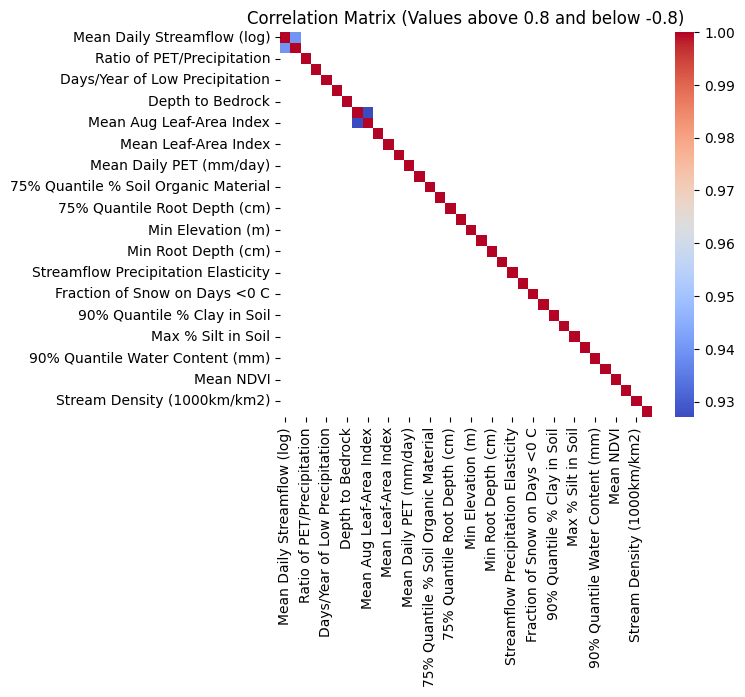

In [51]:
# Again: Filter correlation matrix for values above threshold and below -threshold
corr2 = num_df2.corr(method = 'spearman')
high_corr2 = corr2[(corr2 > threshold) | (corr2 < -threshold)]

# Create heatmap for filtered matrix
plt.figure(figsize=(6,5))
sns.heatmap(high_corr2,
            cmap = 'coolwarm')
plt.title(f'Correlation Matrix (Values above {threshold} and below -{threshold})')
plt.show()

In [52]:
# Unstack the matrix to get pairwise correlations
high_corr_pairs = high_corr2.unstack().dropna()

# Remove duplicates
high_corr_pairs = high_corr_pairs[high_corr_pairs.index.get_level_values(0) != high_corr_pairs.index.get_level_values(1)]
high_corr_pairs = high_corr_pairs[~high_corr_pairs.index.duplicated()]

# Sort by absolute correlation
high_corr_pairs = high_corr_pairs.reindex(high_corr_pairs.abs().sort_values(ascending=False).index)

# Temporarily increase display limit
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(high_corr_pairs)

Mean Daily Streamflow (log)                   Ratio of Mean Daily Streamflow/Precipitation    0.939749
Ratio of Mean Daily Streamflow/Precipitation  Mean Daily Streamflow (log)                     0.939749
Mean Aug NDVI                                 Mean Aug Leaf-Area Index                        0.927077
Mean Aug Leaf-Area Index                      Mean Aug NDVI                                   0.927077
dtype: float64


In [53]:
# Drop selected features
num_df3 = num_df2.drop(columns = [
    'Ratio of Mean Daily Streamflow/Precipitation',
    'Mean Aug Leaf-Area Index'
])

This is good for now. We have some odd/almost redundant features in the dataset, so we're going to only select the features that seem appropriate given our EDA. A less complex model can often be more powerful.

In [54]:
# Look at final columns to select vars
num_df3.columns

Index(['Mean Daily Streamflow (log)', 'Ratio of PET/Precipitation',
       '5% Flow Quantile (mm/day)', 'Days/Year of Low Precipitation',
       'Mean Terrain Slope (Degrees)', 'Depth to Bedrock', 'Mean Aug NDVI',
       'Mean Root Depth (cm)', 'Mean Leaf-Area Index',
       '50% Quantile % Soil Organic Material', 'Mean Daily PET (mm/day)',
       '% Unconsolidated Sediments', '75% Quantile % Soil Organic Material',
       '25% Quantile % Soil Organic Material', '75% Quantile Root Depth (cm)',
       'Mean % Soil Organic Material', 'Min Elevation (m)',
       'Max % Clay in Soil', 'Min Root Depth (cm)', 'Days/Year with No Flow',
       'Streamflow Precipitation Elasticity', 'Mean % Gravel in Soil',
       'Fraction of Snow on Days <0 C', '90% Quantile Root Depth (cm)',
       '90% Quantile % Clay in Soil', '% Metamorphics', 'Max % Silt in Soil',
       '5% Quantile % Soil Organic Material',
       '90% Quantile Water Content (mm)', '75% Quantile % Clay in Soil',
       'Mean NDVI', '75

In [55]:
# Identify final regression columns
reg_model_cols = [
    'Basin ID',
    'Mean Daily Streamflow (log)',
    'Ratio of PET/Precipitation', # Took out 5% flow quantile
    'Days/Year of Low Precipitation', 'Mean Terrain Slope (Degrees)',
    'Depth to Bedrock', 'Mean Aug NDVI', 'Mean Root Depth (cm)',
    'Mean Leaf-Area Index',
    '% Unconsolidated Sediments', # Removed PET since in ratio
    # Only kept mean root depth
    'Mean % Soil Organic Material', # Took out all other OM columns
    'Min Elevation (m)',
    'Max % Clay in Soil', 'Days/Year with No Flow',
    'Streamflow Precipitation Elasticity', 'Mean % Gravel in Soil',
    'Fraction of Snow on Days <0 C',
    '% Metamorphics', 'Max % Silt in Soil',
    '90% Quantile Water Content (mm)', # Removed all but one clay
    'Mean NDVI', '75% Quantile Water Content (mm)',
    'Stream Density (1000km/km2)', '25% Quantile % Sand in Soil',
    'Mean Soil Bulk Density (g/cm3)', # Personal additions
    'Lithological Dominant Class'
]

# Create reg model df
reg_model_df = static_df[reg_model_cols].dropna() # Based on findings from clustering

In [56]:
# Describe df
reg_model_df

,Basin ID,Mean Daily Streamflow (log),Ratio of PET/Precipitation,Days/Year of Low Precipitation,Mean Terrain Slope (Degrees),Depth to Bedrock,Mean Aug NDVI,Mean Root Depth (cm),Mean Leaf-Area Index,% Unconsolidated Sediments,Mean % Soil Organic Material,Min Elevation (m),Max % Clay in Soil,Days/Year with No Flow,Streamflow Precipitation Elasticity,Mean % Gravel in Soil,Fraction of Snow on Days <0 C,% Metamorphics,Max % Silt in Soil,90% Quantile Water Content (mm),Mean NDVI,75% Quantile Water Content (mm),Stream Density (1000km/km2),25% Quantile % Sand in Soil,Mean Soil Bulk Density (g/cm3),Lithological Dominant Class
0,AT000001,1.038155,0.395,198.993,24.122,1.124,0.645,81.571,0.092,22.064,1.218,420.622,40.0,0.000,1.266,9.062,0.326,23.464,64.0,47.279,0.329,47.279,0.151,41.0,1.303,sc
1,AT000002,1.360464,0.390,204.041,26.095,0.565,0.696,58.600,0.089,0.000,1.820,674.209,20.0,0.000,1.223,8.140,0.332,88.549,44.0,51.537,0.342,51.537,0.151,42.0,1.502,mt
2,AT000003,-0.088830,0.411,202.001,25.735,0.593,0.655,51.660,0.087,0.070,1.714,583.510,51.0,0.000,1.802,10.294,0.337,84.653,44.0,51.537,0.313,51.537,0.141,42.0,1.425,mt
3,AT000004,1.625115,0.384,205.803,27.324,0.564,0.657,49.412,0.073,0.000,1.771,1022.324,51.0,0.000,0.324,13.044,0.361,59.940,44.0,51.537,0.276,51.537,0.095,37.0,1.409,mt
4,AT000005,1.199664,0.448,201.796,28.647,0.445,0.612,31.781,0.086,0.000,1.836,567.275,51.0,0.000,0.820,17.658,0.200,15.582,44.0,48.174,0.311,48.174,0.134,37.0,1.384,sc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13511,UAGR0017,-1.897113,1.354,270.637,11.810,0.921,0.796,128.620,0.195,0.000,1.198,161.399,48.0,0.777,2.387,9.939,0.183,0.000,45.0,51.053,0.599,51.053,0.129,23.0,1.246,ss
13512,UAGR0018,-0.744438,1.270,268.322,19.438,0.808,0.689,73.061,0.152,0.000,2.340,16.793,48.0,0.834,2.041,7.469,0.198,0.000,45.0,71.778,0.576,71.778,0.024,23.0,1.066,sc
13513,UAGR0019,-1.164749,1.494,273.598,9.655,0.942,0.694,130.000,0.145,0.000,1.178,306.877,48.0,0.651,2.893,10.049,0.172,0.000,44.0,51.053,0.535,51.053,0.112,23.0,1.251,sc
13514,UAGR0020,-2.590254,1.856,281.568,1.223,4.069,0.425,130.000,0.054,0.000,2.094,33.055,45.0,0.543,3.180,4.000,0.161,22.366,54.0,56.434,0.396,56.434,0.190,13.0,1.303,pa


Let's also test out the sci-kit learn tool for selecting features based on our target model, XGBoost.

In [57]:
# Identify x and y dfs
X = static_df.drop(columns = 'Mean Daily Streamflow (log)').select_dtypes(include=np.number)
X.columns = X.columns.astype(str).str.replace(r'[\[\]<>]', '', regex=True)
y = static_df[['Mean Daily Streamflow (log)']]

# Set up the model
xgb = XGBRegressor(n_estimators=100, random_state=42)

# Use feature importances for selection
selector = SelectFromModel(estimator=xgb, threshold="median")
X_selected = selector.fit_transform(X, y)

# Get selected feature names
selected_features = X.columns[selector.get_support()]
print(selected_features)

Index(['% Mixed Sedimentary Rocks', '% Acid Volcanic Rocks',
       'Depth to Bedrock', '# of Upstream Dams', '# of Upstream Reservoirs',
       '# of Upstream Lakes', 'Total Upstream Lake Volume',
       'Mean Daily Streamflow (mm/day)',
       'Ratio of Mean Daily Streamflow/Precipitation',
       'Streamflow Precipitation Elasticity', '5% Flow Quantile (mm/day)',
       '95% Flow Quantile (mm/day)', 'Mean Daily Precipitation (mm/day)',
       'Mean Daily PET (mm/day)', 'Ratio of PET/Precipitation',
       'Seasonality/Timing of Precipitation', 'Fraction of Snow on Days 0 C',
       'Days/Year of High Precipitation', 'Days/Year of Low Precipitation',
       'Mean Root Depth (cm)', 'Max Root Depth (cm)',
       'Max Available Water Content (mm)', 'Min Available Water Content (mm)',
       '75% Quantile Water Content (mm)', 'Mean % Sand in Soil',
       'Max % Sand in Soil', 'Min % Sand in Soil',
       '5% Quantile % Sand in Soil', '50% Quantile % Sand in Soil',
       '75% Quantile %

As we can see from the above results and earlier correlation EDA, the selected features using the SelectFromModel function selects features that are too highly correlated, causing falsely accurate predictions later on. We will stick with our original selection.

#### Scatter Plots

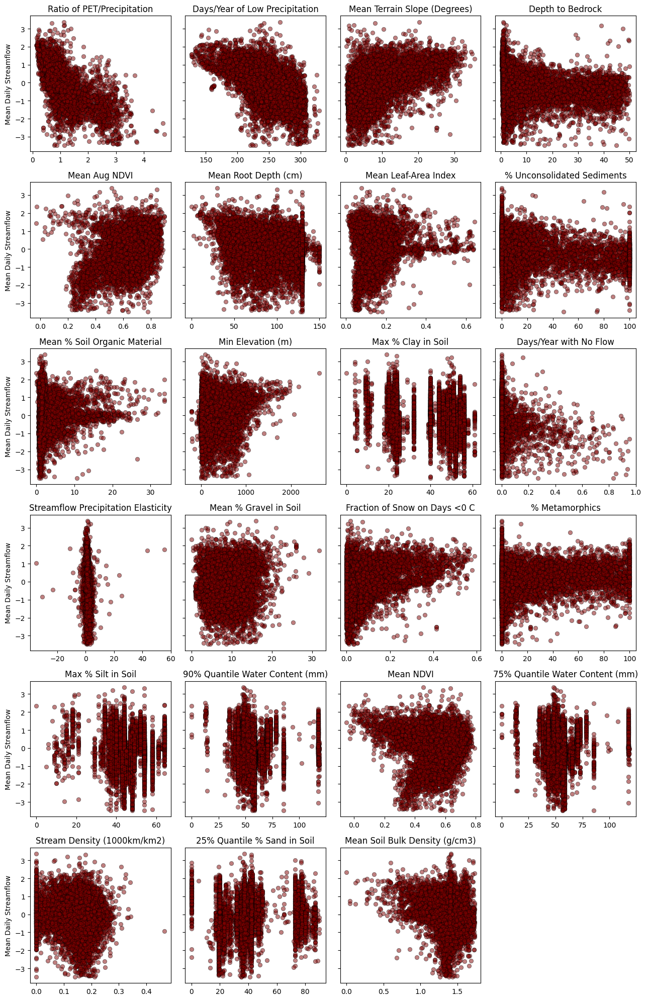

In [58]:
# Create scatter plot of all numerical features against target

# Set up a 6x4 grid of scatter plots

# Define new df for plotting
sc_df = reg_model_df[[
    'Mean Daily Streamflow (log)', 'Ratio of PET/Precipitation',
    'Days/Year of Low Precipitation', 'Mean Terrain Slope (Degrees)',
    'Depth to Bedrock', 'Mean Aug NDVI', 'Mean Root Depth (cm)',
    'Mean Leaf-Area Index', '% Unconsolidated Sediments',
    'Mean % Soil Organic Material', 'Min Elevation (m)',
    'Max % Clay in Soil', 'Days/Year with No Flow',
    'Streamflow Precipitation Elasticity', 'Mean % Gravel in Soil',
    'Fraction of Snow on Days <0 C', '% Metamorphics', 'Max % Silt in Soil',
    '90% Quantile Water Content (mm)', 'Mean NDVI',
    '75% Quantile Water Content (mm)', 'Stream Density (1000km/km2)',
    '25% Quantile % Sand in Soil', 'Mean Soil Bulk Density (g/cm3)'
]]

num_features = [
    'Ratio of PET/Precipitation',
    'Days/Year of Low Precipitation', 'Mean Terrain Slope (Degrees)',
    'Depth to Bedrock', 'Mean Aug NDVI', 'Mean Root Depth (cm)',
    'Mean Leaf-Area Index', '% Unconsolidated Sediments',
    'Mean % Soil Organic Material', 'Min Elevation (m)',
    'Max % Clay in Soil', 'Days/Year with No Flow',
    'Streamflow Precipitation Elasticity', 'Mean % Gravel in Soil',
    'Fraction of Snow on Days <0 C', '% Metamorphics', 'Max % Silt in Soil',
    '90% Quantile Water Content (mm)', 'Mean NDVI',
    '75% Quantile Water Content (mm)', 'Stream Density (1000km/km2)',
    '25% Quantile % Sand in Soil', 'Mean Soil Bulk Density (g/cm3)'
]

fig, axes = plt.subplots(6, 4, figsize=(13, 20), sharey=True)
axes = axes.flatten()

for i, feature in enumerate(num_features):
    ax = axes[i]
    sns.scatterplot(x=sc_df[feature], y=sc_df['Mean Daily Streamflow (log)'],
                    color='maroon', edgecolor='black', linewidth=0.6, alpha = 0.5, ax=ax)
    ax.set_title(feature)
    ax.set_xlabel("")  # Remove x-axis labels
    ax.set_ylabel("Mean Daily Streamflow" if i % 4 == 0 else "")  # Y-axis label only on the first column

# Remove any unused subplots
for j in range(len(num_features), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()

plt.show()

Well, that's not ideal. We'll need to remove:
1. Max % Clay in Soil
2. Streamflow Precipitation Elasticity
3. Max % Silt in Soil
4. 90% Quantile Water Content (mm)
5. 75% Quantile Water Content (mm)
6. 25% Quantile % Sand in Soil

In [59]:
# Drop cols
reg_model_df = reg_model_df.drop(columns = {
    'Max % Clay in Soil',
    'Streamflow Precipitation Elasticity',
    'Max % Silt in Soil',
    '90% Quantile Water Content (mm)',
    '75% Quantile Water Content (mm)',
    '25% Quantile % Sand in Soil'
})

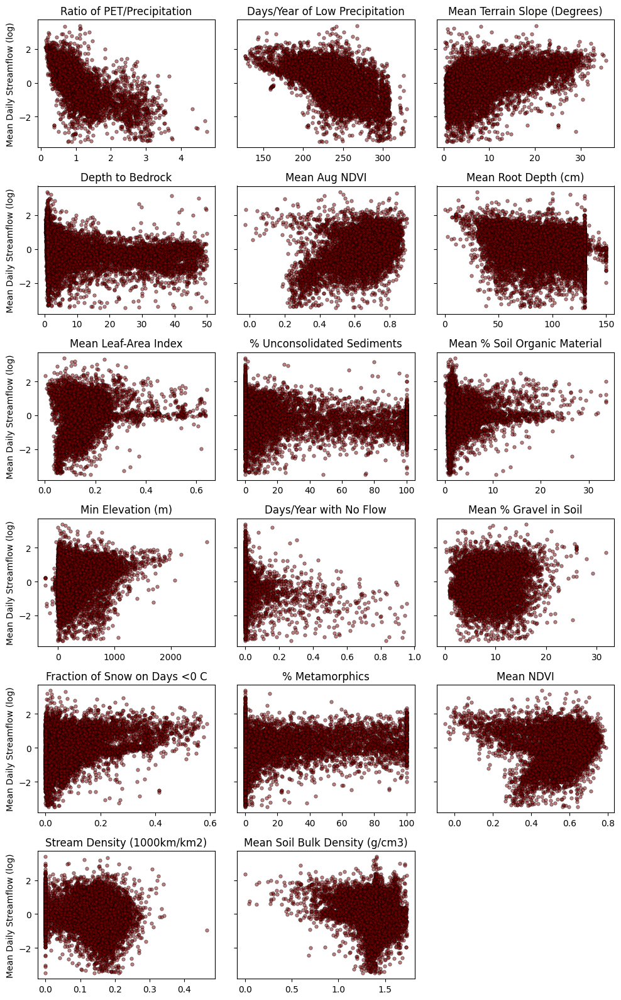

In [60]:
# Create scatter plot of all numerical features against target

# Set up a 6x3 grid of scatter plots

# Define new df for plotting
sc_df = reg_model_df[[
    'Mean Daily Streamflow (log)', 'Ratio of PET/Precipitation',
    'Days/Year of Low Precipitation', 'Mean Terrain Slope (Degrees)',
    'Depth to Bedrock', 'Mean Aug NDVI', 'Mean Root Depth (cm)',
    'Mean Leaf-Area Index', '% Unconsolidated Sediments',
    'Mean % Soil Organic Material', 'Min Elevation (m)',
    'Days/Year with No Flow',
    'Mean % Gravel in Soil',
    'Fraction of Snow on Days <0 C', '% Metamorphics','Mean NDVI',
    'Stream Density (1000km/km2)',
    'Mean Soil Bulk Density (g/cm3)'
]]

num_features = [
    'Ratio of PET/Precipitation',
    'Days/Year of Low Precipitation', 'Mean Terrain Slope (Degrees)',
    'Depth to Bedrock', 'Mean Aug NDVI', 'Mean Root Depth (cm)',
    'Mean Leaf-Area Index', '% Unconsolidated Sediments',
    'Mean % Soil Organic Material', 'Min Elevation (m)',
    'Days/Year with No Flow',
    'Mean % Gravel in Soil',
    'Fraction of Snow on Days <0 C', '% Metamorphics','Mean NDVI',
    'Stream Density (1000km/km2)',
    'Mean Soil Bulk Density (g/cm3)'
]

fig, axes = plt.subplots(6, 3, figsize=(10, 16), sharey=True)
axes = axes.flatten()

for i, feature in enumerate(num_features):
    ax = axes[i]
    sns.scatterplot(x=sc_df[feature], y=sc_df['Mean Daily Streamflow (log)'],
                    color='maroon', edgecolor='black', linewidth=0.6, alpha = 0.5, s=15, ax=ax)
    ax.set_title(feature)
    ax.set_xlabel("")  # Remove x-axis labels
    ax.set_ylabel("Mean Daily Streamflow (log)" if i % 3 == 0 else "")  # Y-axis label only on the first column

# Remove any unused subplots
for j in range(len(num_features), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()

plt.show()

## Step 3. Transformations

### Step 3a. Categorical Columns

Since the lithological dominant class column has a lot of minority classes, we'll turn them into an "other" class for model building.

In [61]:
# Define num of classes
top_n = 6
top_classes = reg_model_df['Lithological Dominant Class'].value_counts().nlargest(top_n).index

# Regroup into 'other'
reg_model_df['Lithological Dominant Class (Grouped)'] = reg_model_df['Lithological Dominant Class'].where(reg_model_df['Lithological Dominant Class'].isin(top_classes), other='Other')
reg_model_df = reg_model_df.drop(columns = ['Lithological Dominant Class'])

In [62]:
# Convert to category dtype
reg_model_df['Lithological Dominant Class (Grouped)'] = reg_model_df['Lithological Dominant Class (Grouped)'].astype('category')

# Rename categories using a dictionary
reg_model_df['Lithological Dominant Class (Grouped)'] = reg_model_df['Lithological Dominant Class (Grouped)'].cat.rename_categories({'sc': 'Carbonate Sedimentary',
                                                                                                                                     'su': 'Unconsolidated Sediments',
                                                                                                                                     'mt': 'Metamorphics',
                                                                                                                                     'sm':'Mixed Sedimentary',
                                                                                                                                     'ss':'Siliciclastic Sedimentary',
                                                                                                                                     'pa':'Acid Plutonic'})

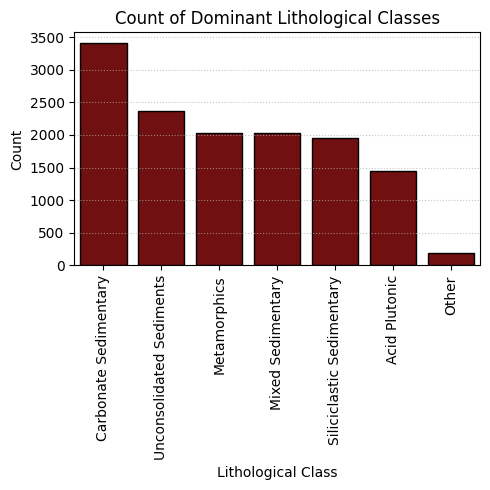

In [63]:
# Plot bar plot of dominant lithological class
plt.figure(figsize=(5, 5))
sns.countplot(data=reg_model_df, x='Lithological Dominant Class (Grouped)',
              order=reg_model_df['Lithological Dominant Class (Grouped)'].value_counts().index,
              color = 'maroon', edgecolor = 'k')
plt.title('Count of Dominant Lithological Classes')
plt.xticks(rotation = 90)
plt.xlabel('Lithological Class')
plt.ylabel('Count')
plt.grid(axis = 'y', alpha = 0.7, linestyle = ':')
plt.tight_layout()
plt.show()

### Feature Transformation
We will explore transforming the feature sets to more closely follow a Gaussian distribution. We will use visual and statistical methods to select the best transformation tested. We will test:
- log
- square root
- power
- box-cox
- reciprocal
- Yeo-Johnson Power Transformation
- Normal Quantile Transformation

We will go through each feature individually below.

In [64]:
# Define function for applying transformations
def apply_transformation(data, transform):
    if transform == 'log':
        return np.log(data + 1)
    elif transform == 'sqrt':
        return np.sqrt(data)
    elif transform == 'cbrt':
        return np.power(data, 1/3)
    elif transform == 'boxcox':
        if (data > 0).all():
            return stats.boxcox(data)[0]
        else:
            return None
    elif transform == 'reciprocal':
        return 1 / (data + 1)
    elif transform == 'yeo_johnson':
        pt = PowerTransformer(method='yeo-johnson')
        return pt.fit_transform(data.values.reshape(-1, 1)).flatten()
    elif transform == 'quantile_normal':
        qt = QuantileTransformer(output_distribution='normal')
        return qt.fit_transform(data.values.reshape(-1, 1)).flatten()
    else:
        return data

# Define function for evaluating normality based on statistical measures (Shapiro and Anderson)
def evaluate_normality(data):
    shapiro_stat, shapiro_p_value = stats.shapiro(data)
    ad_stat, ad_critical_values, ad_significance_level = stats.anderson(data, dist='norm')
    return {
        'shapiro_stat': shapiro_stat,
        'shapiro_p_value': shapiro_p_value,
        'ad_stat': ad_stat,
        'ad_significance_level': ad_significance_level
    }

# Define function that uses apply_transformation and evaluate_normality to visualize and test for normality
def normality(data, feature):
    transformations = {
        'Original': None,
        'Log': 'log',
        'Square Root': 'sqrt',
        'Cube Root': 'cbrt',
        'Box-Cox': 'boxcox',
        'Reciprocal': 'reciprocal',
        'Yeo-Johnson': 'yeo_johnson',
        'Quantile Normal': 'quantile_normal'
    }

    results = {}

    fig, axes = plt.subplots(len(transformations), 2, figsize=(8, 4 * len(transformations)))

    # Handle infinite values in the original data
    original_data = data[feature].replace([np.inf, -np.inf], np.nan).dropna()

    for i, (name, transform) in enumerate(transformations.items()):
        if transform is None:
            transformed_data = original_data
        else:
            transformed_data = apply_transformation(original_data, transform)
            if transformed_data is None:
                axes[i, 0].set_visible(False)
                axes[i, 1].set_visible(False)
                continue

        # Plot two normality plots -> KDE and Q-Q
        sns.kdeplot(transformed_data, ax=axes[i, 0])
        axes[i, 0].set_title(f'{name} KDE')
        stats.probplot(transformed_data, plot=axes[i, 1])
        axes[i, 1].set_title(f'{name} Q-Q plot')

        # Evaluate normality
        result = evaluate_normality(transformed_data)
        results[name] = result

    plt.tight_layout()
    plt.show()

    # Print the results
    for name, result in results.items():
        print(f'{name} Transformation:')
        print(f'  Shapiro-Wilk Test Statistic = {result["shapiro_stat"]:.4f}, p-value = {result["shapiro_p_value"]:.4f}')
        print(f'  Anderson-Darling Test Statistic = {result["ad_stat"]:.4f}, Significance Level = {result["ad_significance_level"]}\n')

    # Find and print the best transformation based on Shapiro-Wilk Test
    best_transformation = max(results, key=lambda x: results[x]['shapiro_stat'])
    print(f'Best transformation according to Shapiro-Wilk Test: {best_transformation}')

    # Find and print the best transformation based on Anderson-Darling Test
    best_ad_transformation = min(results, key=lambda x: results[x]['ad_stat'])
    print(f'Best transformation according to Anderson-Darling Test: {best_ad_transformation}')

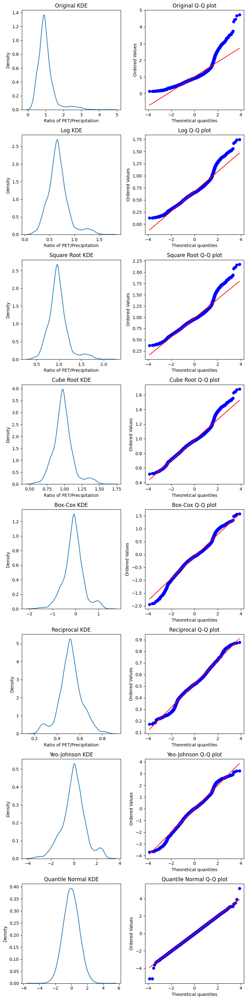

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.8320, p-value = 0.0000
  Anderson-Darling Test Statistic = 521.6435, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.9425, p-value = 0.0000
  Anderson-Darling Test Statistic = 181.9653, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9372, p-value = 0.0000
  Anderson-Darling Test Statistic = 202.9305, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9592, p-value = 0.0000
  Anderson-Darling Test Statistic = 144.9830, Significance Level = [15.  10.   5.   2.5  1. ]

Box-Cox Transformation:
  Shapiro-Wilk Test Statistic = 0.9771, p-value = 0.0000
  Anderson-Darling Test Statistic = 100.1450, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.9858, p-value = 0.0000
  Anderson-Darling Test Statistic

In [65]:
# Normality of PET/Precipitation
normality(reg_model_df, 'Ratio of PET/Precipitation')

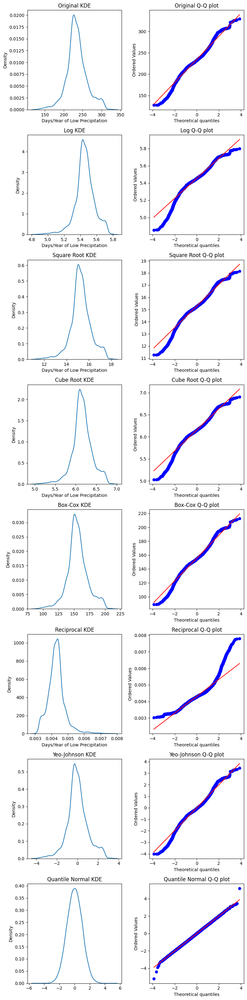

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.9766, p-value = 0.0000
  Anderson-Darling Test Statistic = 110.6005, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.9648, p-value = 0.0000
  Anderson-Darling Test Statistic = 108.4939, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9742, p-value = 0.0000
  Anderson-Darling Test Statistic = 101.4067, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9719, p-value = 0.0000
  Anderson-Darling Test Statistic = 101.9074, Significance Level = [15.  10.   5.   2.5  1. ]

Box-Cox Transformation:
  Shapiro-Wilk Test Statistic = 0.9767, p-value = 0.0000
  Anderson-Darling Test Statistic = 107.7771, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.9221, p-value = 0.0000
  Anderson-Darling Test Statistic

In [66]:
# noramlity of low precip days
normality(reg_model_df, 'Days/Year of Low Precipitation')

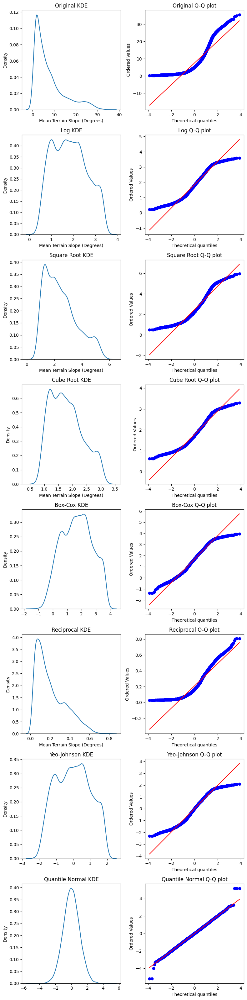

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.8340, p-value = 0.0000
  Anderson-Darling Test Statistic = 726.7481, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.9721, p-value = 0.0000
  Anderson-Darling Test Statistic = 84.5212, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9411, p-value = 0.0000
  Anderson-Darling Test Statistic = 221.2418, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9652, p-value = 0.0000
  Anderson-Darling Test Statistic = 117.7315, Significance Level = [15.  10.   5.   2.5  1. ]

Box-Cox Transformation:
  Shapiro-Wilk Test Statistic = 0.9828, p-value = 0.0000
  Anderson-Darling Test Statistic = 47.8407, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.9051, p-value = 0.0000
  Anderson-Darling Test Statistic =

In [67]:
# Normality slope
normality(reg_model_df, 'Mean Terrain Slope (Degrees)')

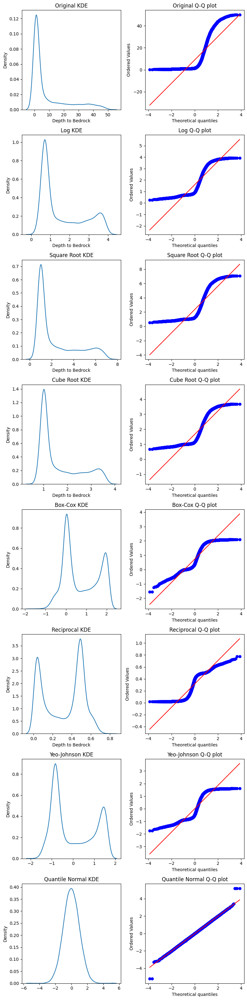

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.6834, p-value = 0.0000
  Anderson-Darling Test Statistic = 1827.6242, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.8138, p-value = 0.0000
  Anderson-Darling Test Statistic = 1042.7041, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.7726, p-value = 0.0000
  Anderson-Darling Test Statistic = 1284.1514, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.8024, p-value = 0.0000
  Anderson-Darling Test Statistic = 1107.4213, Significance Level = [15.  10.   5.   2.5  1. ]

Box-Cox Transformation:
  Shapiro-Wilk Test Statistic = 0.8926, p-value = 0.0000
  Anderson-Darling Test Statistic = 599.5131, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.8686, p-value = 0.0000
  Anderson-Darling Test Stati

In [68]:
# Normality for depth to bedrock
normality(reg_model_df, 'Depth to Bedrock')

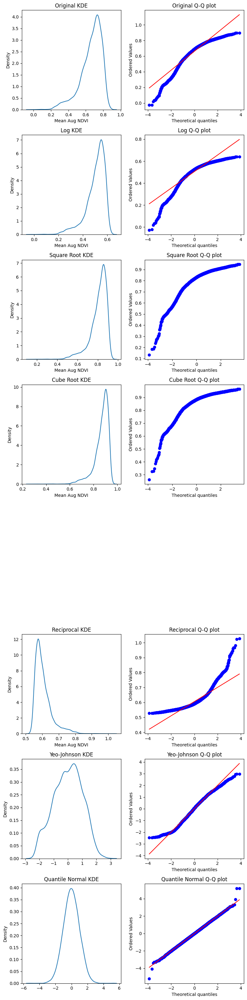

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.9175, p-value = 0.0000
  Anderson-Darling Test Statistic = 282.9606, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.8856, p-value = 0.0000
  Anderson-Darling Test Statistic = 387.3383, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = nan, p-value = nan
  Anderson-Darling Test Statistic = nan, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = nan, p-value = nan
  Anderson-Darling Test Statistic = nan, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.8461, p-value = 0.0000
  Anderson-Darling Test Statistic = 515.4981, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9908, p-value = 0.0000
  Anderson-Darling Test Statistic = 26.3597, Signif

In [69]:
# Normality NDVI
normality(reg_model_df, 'Mean Aug NDVI')

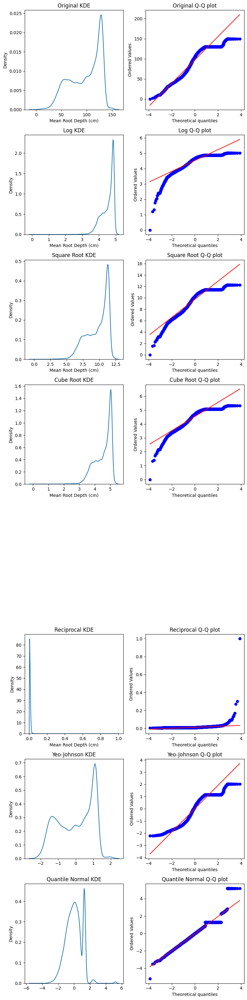

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.9063, p-value = 0.0000
  Anderson-Darling Test Statistic = 448.6086, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.8494, p-value = 0.0000
  Anderson-Darling Test Statistic = 597.0304, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.8909, p-value = 0.0000
  Anderson-Darling Test Statistic = 504.9482, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.8805, p-value = 0.0000
  Anderson-Darling Test Statistic = 531.0608, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.2360, p-value = 0.0000
  Anderson-Darling Test Statistic = 1925.9381, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9108, p-value = 0.0000
  Anderson-Darling Test Stat

In [70]:
# normality root depth
normality(reg_model_df, 'Mean Root Depth (cm)')

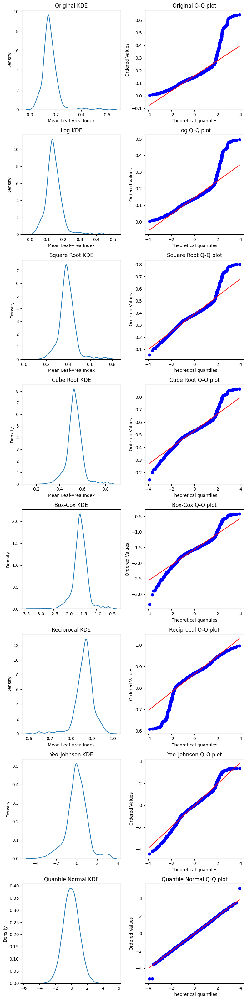

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.8031, p-value = 0.0000
  Anderson-Darling Test Statistic = 453.3487, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.8542, p-value = 0.0000
  Anderson-Darling Test Statistic = 329.2993, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9205, p-value = 0.0000
  Anderson-Darling Test Statistic = 205.2988, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9389, p-value = 0.0000
  Anderson-Darling Test Statistic = 180.4824, Significance Level = [15.  10.   5.   2.5  1. ]

Box-Cox Transformation:
  Shapiro-Wilk Test Statistic = 0.9440, p-value = 0.0000
  Anderson-Darling Test Statistic = 179.3066, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.8958, p-value = 0.0000
  Anderson-Darling Test Statistic

In [71]:
# Normality for LAI
normality(reg_model_df, 'Mean Leaf-Area Index')

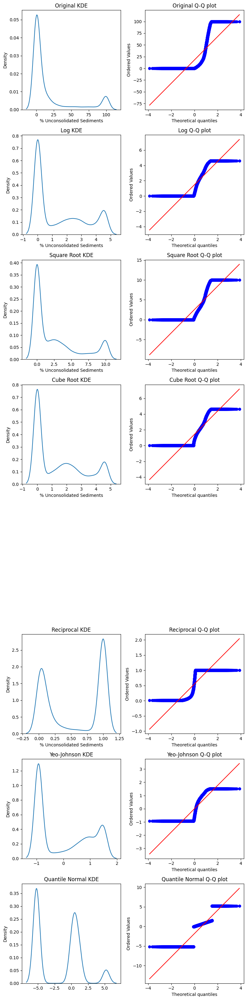

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.6083, p-value = 0.0000
  Anderson-Darling Test Statistic = 2304.3719, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.7838, p-value = 0.0000
  Anderson-Darling Test Statistic = 1172.9724, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.7509, p-value = 0.0000
  Anderson-Darling Test Statistic = 1314.2117, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.8003, p-value = 0.0000
  Anderson-Darling Test Statistic = 1027.8347, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.7226, p-value = 0.0000
  Anderson-Darling Test Statistic = 1666.8242, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.7748, p-value = 0.0000
  Anderson-Darling Test 

In [72]:
# normality unconsolidated sediments
normality(reg_model_df, '% Unconsolidated Sediments')

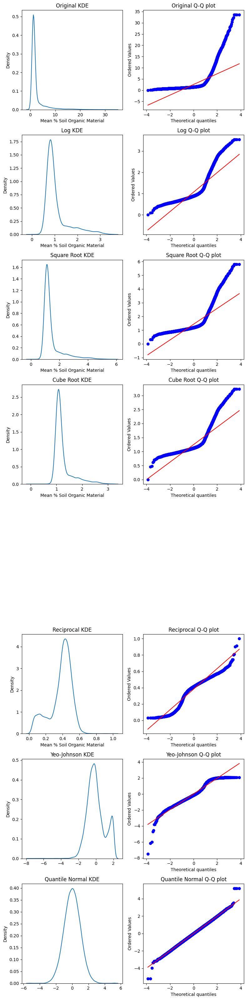

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.5022, p-value = 0.0000
  Anderson-Darling Test Statistic = 2355.7259, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.7541, p-value = 0.0000
  Anderson-Darling Test Statistic = 1178.6609, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.6736, p-value = 0.0000
  Anderson-Darling Test Statistic = 1521.6661, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.7321, p-value = 0.0000
  Anderson-Darling Test Statistic = 1252.4078, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.9199, p-value = 0.0000
  Anderson-Darling Test Statistic = 403.5808, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9646, p-value = 0.0000
  Anderson-Darling Test S

In [73]:
# normality for OM
normality(reg_model_df, 'Mean % Soil Organic Material')

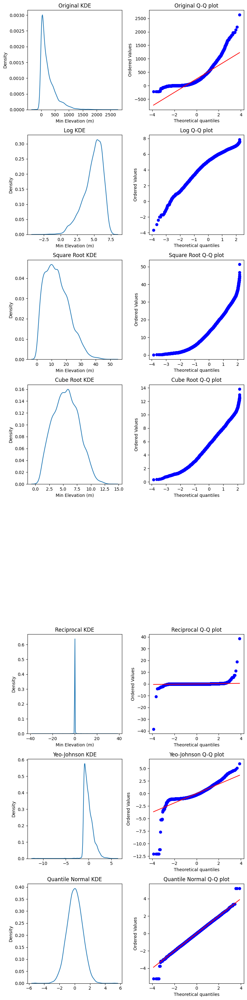

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.8099, p-value = 0.0000
  Anderson-Darling Test Statistic = 700.4822, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = nan, p-value = nan
  Anderson-Darling Test Statistic = nan, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = nan, p-value = nan
  Anderson-Darling Test Statistic = nan, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = nan, p-value = nan
  Anderson-Darling Test Statistic = nan, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.0471, p-value = 0.0000
  Anderson-Darling Test Statistic = 4376.2858, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.8789, p-value = 0.0000
  Anderson-Darling Test Statistic = 321.3972, Significance Le

In [74]:
# Normality for min elev
normality(reg_model_df, 'Min Elevation (m)')

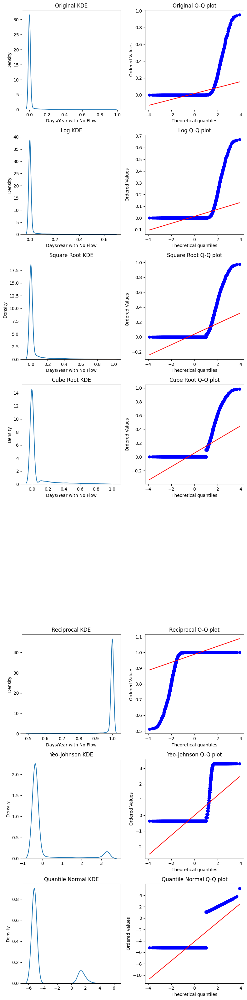

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.2179, p-value = 0.0000
  Anderson-Darling Test Statistic = 4211.7801, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.2368, p-value = 0.0000
  Anderson-Darling Test Statistic = 4173.2963, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.3497, p-value = 0.0000
  Anderson-Darling Test Statistic = 3649.6866, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.4161, p-value = 0.0000
  Anderson-Darling Test Statistic = 3455.8080, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.2532, p-value = 0.0000
  Anderson-Darling Test Statistic = 4142.3736, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.4023, p-value = 0.0000
  Anderson-Darling Test 

In [75]:
# normality for no flow
normality(reg_model_df, 'Days/Year with No Flow')

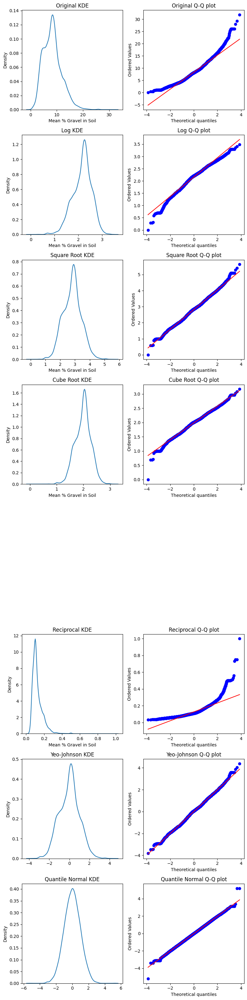

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.9709, p-value = 0.0000
  Anderson-Darling Test Statistic = 66.7694, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.9855, p-value = 0.0000
  Anderson-Darling Test Statistic = 58.9048, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9976, p-value = 0.0000
  Anderson-Darling Test Statistic = 12.7904, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9949, p-value = 0.0000
  Anderson-Darling Test Statistic = 24.2074, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.8282, p-value = 0.0000
  Anderson-Darling Test Statistic = 480.7610, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9977, p-value = 0.0000
  Anderson-Darling Test Statistic

In [76]:
# Normality for gravel
normality(reg_model_df, 'Mean % Gravel in Soil')

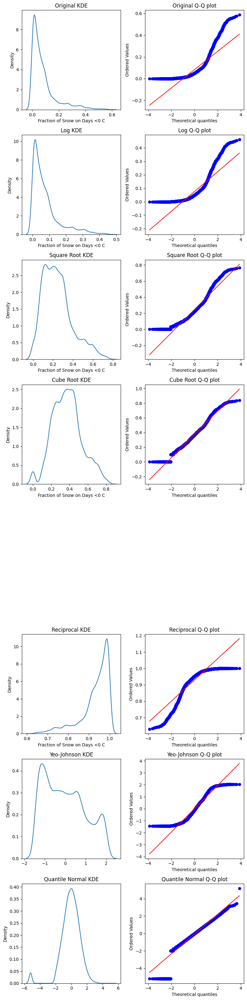

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.7567, p-value = 0.0000
  Anderson-Darling Test Statistic = 1007.2345, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.7919, p-value = 0.0000
  Anderson-Darling Test Statistic = 855.1683, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9474, p-value = 0.0000
  Anderson-Darling Test Statistic = 182.2799, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.9888, p-value = 0.0000
  Anderson-Darling Test Statistic = 37.0179, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.8232, p-value = 0.0000
  Anderson-Darling Test Statistic = 721.2136, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9460, p-value = 0.0000
  Anderson-Darling Test Stati

In [77]:
# normality for snow
normality(reg_model_df, 'Fraction of Snow on Days <0 C')

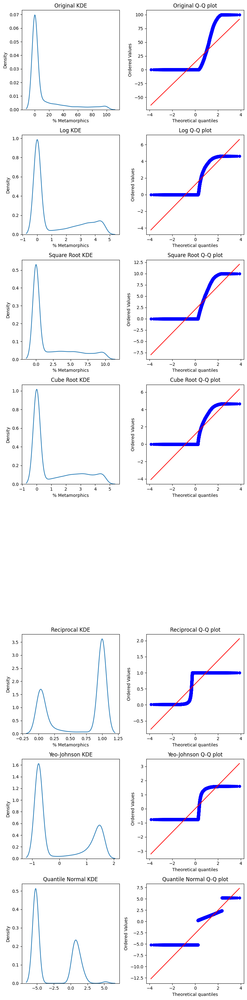

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.5988, p-value = 0.0000
  Anderson-Darling Test Statistic = 2335.6945, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.7020, p-value = 0.0000
  Anderson-Darling Test Statistic = 1865.2475, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.6970, p-value = 0.0000
  Anderson-Darling Test Statistic = 1808.7408, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.7209, p-value = 0.0000
  Anderson-Darling Test Statistic = 1702.0949, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.6617, p-value = 0.0000
  Anderson-Darling Test Statistic = 2189.3854, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.6795, p-value = 0.0000
  Anderson-Darling Test 

In [78]:
# normality for metamorphics
normality(reg_model_df, '% Metamorphics')

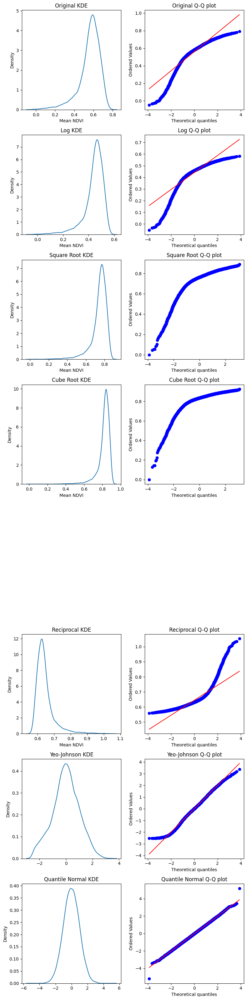

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.8942, p-value = 0.0000
  Anderson-Darling Test Statistic = 329.9484, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.8491, p-value = 0.0000
  Anderson-Darling Test Statistic = 468.3439, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = nan, p-value = nan
  Anderson-Darling Test Statistic = nan, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = nan, p-value = nan
  Anderson-Darling Test Statistic = nan, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.7942, p-value = 0.0000
  Anderson-Darling Test Statistic = 642.0896, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9964, p-value = 0.0000
  Anderson-Darling Test Statistic = 9.5625, Signifi

In [79]:
# Normality for NDVI
normality(reg_model_df, 'Mean NDVI')

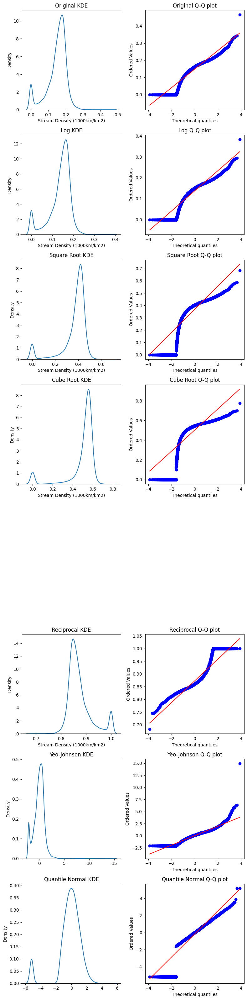

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.8978, p-value = 0.0000
  Anderson-Darling Test Statistic = 461.7885, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.8792, p-value = 0.0000
  Anderson-Darling Test Statistic = 543.6197, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.7166, p-value = 0.0000
  Anderson-Darling Test Statistic = 1255.2893, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.6022, p-value = 0.0000
  Anderson-Darling Test Statistic = 1834.3726, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.8590, p-value = 0.0000
  Anderson-Darling Test Statistic = 632.7666, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9577, p-value = 0.0000
  Anderson-Darling Test Sta

In [80]:
# normality for stream density
normality(reg_model_df, 'Stream Density (1000km/km2)')

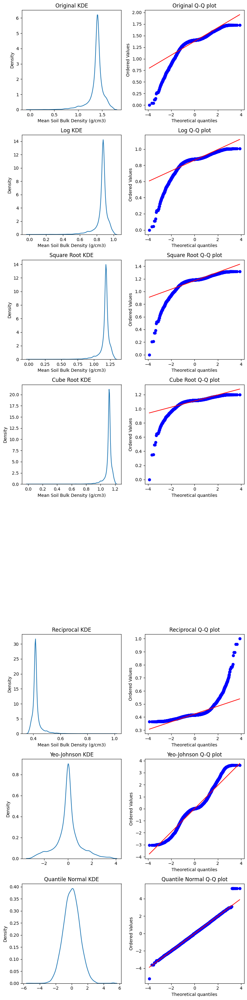

Original Transformation:
  Shapiro-Wilk Test Statistic = 0.8140, p-value = 0.0000
  Anderson-Darling Test Statistic = 746.3773, Significance Level = [15.  10.   5.   2.5  1. ]

Log Transformation:
  Shapiro-Wilk Test Statistic = 0.7457, p-value = 0.0000
  Anderson-Darling Test Statistic = 939.4511, Significance Level = [15.  10.   5.   2.5  1. ]

Square Root Transformation:
  Shapiro-Wilk Test Statistic = 0.7388, p-value = 0.0000
  Anderson-Darling Test Statistic = 939.5685, Significance Level = [15.  10.   5.   2.5  1. ]

Cube Root Transformation:
  Shapiro-Wilk Test Statistic = 0.6987, p-value = 0.0000
  Anderson-Darling Test Statistic = 1030.2026, Significance Level = [15.  10.   5.   2.5  1. ]

Reciprocal Transformation:
  Shapiro-Wilk Test Statistic = 0.6562, p-value = 0.0000
  Anderson-Darling Test Statistic = 1196.0211, Significance Level = [15.  10.   5.   2.5  1. ]

Yeo-Johnson Transformation:
  Shapiro-Wilk Test Statistic = 0.9408, p-value = 0.0000
  Anderson-Darling Test Sta

In [82]:
# normality for bulk density
normality(reg_model_df, 'Mean Soil Bulk Density (g/cm3)')

**Note:** We will not transform the features here. We are going to select the best transformations, then apply them in the model building pipeline later on. This will allow for the reversal of transformations if necessary.

##### Selected Transformations
1. Ratio of PET/Precipitation --> Quantile Normal
3. Days/Year of Low Precipitation --> Quantile Normal
2. Mean Terrain Slope (Degrees) --> Quantile Normal
3. Depth to Bedrock --> Quantile Normal
3. Mean Aug NDVI --> Quantile Normal
5. Mean Root Depth (cm) --> None
6. Mean Leaf-Area Index --> Quantile Normal
6. % Unconsolidated Sediments --> None
7. Mean % Soil Organic Material --> Quantile Normal
8. Min Elevation (m) --> Quantile Normal
8. Days/Year with No Flow --> None
9. Mean % Gravel in Soil --> Quantile Normal
9. Fraction of Snow on Days <0 C --> Square Root
11. % Metamorphics --> None
12. Mean NDVI --> Quantile Normal
13. Stream Density (1000km/km2) --> None
16. Mean Soil Bulk Density (g/cm3) --> Quantile Normal

### Final Mean Regression Prediction Dataset

In [84]:
# Export to data folder
reg_path = os.path.join(BASE_DIR, 'mean_regression', 'processed_data', 'mean_reg_model_ready_df.xlsx')
reg_model_df.to_excel(reg_path)
print(f'Dataset saved to {reg_path}')

Dataset saved to /content/HydroLearners_Proj/mean_regression/processed_data/mean_reg_model_ready_df.xlsx
